# Project Name: Bike Demand Prediction

# Problem Statement
The problem that this project aims to solve is to accurately forecast the demand for bikes in a given time period for a bike rental company. Accurate demand prediction is crucial for bike rental companies, as it allows them to optimize their inventory and pricing strategies in order to meet the needs of their customers. However, predicting bike demand can be challenging due to the influence of various factors, including the time and date of the rental, weather conditions, and local events. By developing a machine learning model that can accurately predict bike demand, bike rental companies can make more informed decisions about how to allocate their resources and serve their customers.

My goal was to develop a model that is highly accurate, with a low mean absolute error and a high R-squared value. The model should also be able to provide insights into the factors that most impact bike demand, helping the bike sharing company to make data-driven decisions about how to optimize their operations.

In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_csv("Data.csv",encoding="ISO-8859-1")

In [3]:
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


## features
Date: The calendar date of the observation.

Rented Bike Count: The number of bikes rented during the given hour (target variable for prediction).

Hour: The hour of the day (0 to 23).

Temperature(°C): Temperature in degrees Celsius.

Humidity(%): Humidity percentage.

Wind speed (m/s): Wind speed in meters per second.

Visibility (10m): Visibility in units of 10 meters.

Dew point temperature(°C): Dew point temperature in Celsius, indicating the temperature at which air becomes saturated with moisture.

Solar Radiation (MJ/m2): Amount of solar energy received per square meter (megajoules).

Rainfall(mm): Amount of rainfall in millimeters.

Snowfall (cm): Amount of snowfall in centimeters.

Seasons: Season of the year (e.g., Winter, Spring, Summer, Autumn).

Holiday: Whether the day is a holiday (No Holiday, Holiday).

Functioning Day: Whether the bike rental system was operational (Yes, No).

In [4]:
df.shape

(8760, 14)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

##### Duplicate Values

In [6]:
df.duplicated().value_counts()

False    8760
Name: count, dtype: int64

##### Missing/Null values

In [7]:
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

# About the Dataset
There are 8760 observation and 14 features.
There is no null values.
Dataset has all unique values i.e., there is no duplicate which means data is free from bias as duplicates can cause problems in downstream analyses, such as biasing results or making it difficult to accurately summarize the data.
Date has object data type it should be datetime data type.

### Understanding the variables

In [8]:
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [9]:
df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


##### Checking unique values of each variable

In [10]:
for i in df.columns.tolist():
    print(f"No. of unique values in {i} is : {df[i].nunique()}")

No. of unique values in Date is : 365
No. of unique values in Rented Bike Count is : 2166
No. of unique values in Hour is : 24
No. of unique values in Temperature(°C) is : 546
No. of unique values in Humidity(%) is : 90
No. of unique values in Wind speed (m/s) is : 65
No. of unique values in Visibility (10m) is : 1789
No. of unique values in Dew point temperature(°C) is : 556
No. of unique values in Solar Radiation (MJ/m2) is : 345
No. of unique values in Rainfall(mm) is : 61
No. of unique values in Snowfall (cm) is : 51
No. of unique values in Seasons is : 4
No. of unique values in Holiday is : 2
No. of unique values in Functioning Day is : 2


# Data Wrangling

In [11]:
dff=df.copy()

In [12]:
dff.rename({
    "Temperature(°C)":"Temperature",
    "Functioning Day":"Functioning_Day",
    "Humidity(%)":"Humidity",
    "Wind speed (m/s)":"Wind_speed",
    "Visibility (10m)":"Visibility",
    "Dew point temperature(°C)":"Dew_point_temperature",
    "Solar Radiation (MJ/m2)":"Solar_Radiation",
    "Rainfall(mm)":"Rainfall",
    "Snowfall (cm)":"Snowfall",
    "Rented Bike Count":"Rented_Bike_Count"
},axis=1,inplace=True)

In [13]:
dff.columns

Index(['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity',
       'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation',
       'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day'],
      dtype='object')

###### Changind 'Date' into 'datetime'

In [14]:
dff['Date']=pd.to_datetime(dff['Date'],dayfirst=True)

In [15]:
import calendar
# Extracting month from date column
dff['Month']=pd.DatetimeIndex(df['Date']).month
dff['Month']=dff['Month'].apply(lambda x:calendar.month_abbr[x])

In [16]:
# Extracting day form Date column
dff['Day']=dff['Date'].dt.day_name()

In [17]:
# Extracting year from Date column
dff['Year']=dff['Date'].dt.year

In [18]:
# Dropping the Date column
dff.drop(columns=['Date'],inplace=True)

In [19]:
dff.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day',
       'Year'],
      dtype='object')

In [20]:
dff.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017


# Finding the insights from features

In [21]:
# Functioning_Day mean,median and sum
numeric_cols=dff.select_dtypes(include='number').columns
dff.groupby('Functioning_Day')[numeric_cols].agg(['mean','median','sum']).T

Functioning_Day                          No           Yes
Rented_Bike_Count     mean         0.000000  7.291570e+02
                      median       0.000000  5.420000e+02
                      sum          0.000000  6.172314e+06
Hour                  mean        11.298305  1.150703e+01
                      median      11.000000  1.200000e+01
                      sum       3333.000000  9.740700e+04
Temperature           mean        16.092881  1.277106e+01
                      median      16.300000  1.350000e+01
                      sum       4747.400000  1.081070e+05
Humidity              mean        60.494915  5.814719e+01
                      median      62.000000  5.700000e+01
                      sum      17846.000000  4.922160e+05
Wind_speed            mean         1.696949  1.725883e+00
                      median       1.500000  1.500000e+00
                      sum        500.600000  1.460960e+04
Visibility            mean      1521.542373  1.433873e+03
                      median    1814.000000  1.690000e+03
                      sum     448855.000000  1.213774e+07
Dew_point_temperature mean         7.770169  3.944997e+00
                      median       7.800000  4.700000e+00
                      sum       2292.200000  3.339440e+04
Solar_Radiation       mean         0.604780  5.678677e-01
                      median       0.000000  1.000000e-02
                      sum        178.410000  4.807000e+03
Rainfall              mean         0.136271  1.491199e-01
                      median       0.000000  0.000000e+00
                      sum         40.200000  1.262300e+03
Snowfall              mean         0.000000  7.768458e-02
                      median       0.000000  0.000000e+00
                      sum          0.000000  6.576000e+02
Year                  mean      2018.000000  2.017912e+03
                      median    2018.000000  2.018000e+03
                      sum     595310.000000  1.708163e+07

In [22]:
# Seasons mean,median and sum
numeric_cols=dff.select_dtypes(include='number').columns
dff.groupby('Seasons')[numeric_cols].agg(['mean','median','sum']).T

Seasons                             Autumn        Spring        Summer  \
Rented_Bike_Count     mean    8.195980e+02  7.300312e+02  1.034073e+03   
                      median  7.635000e+02  5.830000e+02  9.055000e+02   
                      sum     1.790002e+06  1.611909e+06  2.283234e+06   
Hour                  mean    1.150000e+01  1.150000e+01  1.150000e+01   
                      median  1.150000e+01  1.150000e+01  1.150000e+01   
                      sum     2.511600e+04  2.539200e+04  2.539200e+04   
Temperature           mean    1.412083e+01  1.304669e+01  2.658279e+01   
                      median  1.385000e+01  1.330000e+01  2.660000e+01   
                      sum     3.083990e+04  2.880710e+04  5.869480e+04   
Humidity              mean    5.922848e+01  5.877672e+01  6.498143e+01   
                      median  5.900000e+01  5.800000e+01  6.500000e+01   
                      sum     1.293550e+05  1.297790e+05  1.434790e+05   
Wind_speed            mean    1.494734e+00  1.874592e+00  1.609420e+00   
                      median  1.300000e+00  1.700000e+00  1.500000e+00   
                      sum     3.264500e+03  4.139100e+03  3.553600e+03   
Visibility            mean    1.560752e+03  1.240365e+03  1.501745e+03   
                      median  1.900000e+03  1.307500e+03  1.740500e+03   
                      sum     3.408683e+06  2.738725e+06  3.315854e+06   
Dew_point_temperature mean    5.498718e+00  4.120063e+00  1.875014e+01   
                      median  5.500000e+00  4.600000e+00  2.000000e+01   
                      sum     1.200920e+04  9.097100e+03  4.140030e+04   
Solar_Radiation       mean    5.218178e-01  6.887862e-01  7.612545e-01   
                      median  0.000000e+00  6.000000e-02  1.600000e-01   
                      sum     1.139650e+03  1.520840e+03  1.680850e+03   
Rainfall              mean    1.227564e-01  1.828804e-01  2.534873e-01   
                      median  0.000000e+00  0.000000e+00  0.000000e+00   
                      sum     2.681000e+02  4.038000e+02  5.597000e+02   
Snowfall              mean    5.631868e-02  0.000000e+00  0.000000e+00   
                      median  0.000000e+00  0.000000e+00  0.000000e+00   
                      sum     1.230000e+02  0.000000e+00  0.000000e+00   
Year                  mean    2.018000e+03  2.018000e+03  2.018000e+03   
                      median  2.018000e+03  2.018000e+03  2.018000e+03   
                      sum     4.407312e+06  4.455744e+06  4.455744e+06   

Seasons                             Winter  
Rented_Bike_Count     mean    2.255412e+02  
                      median  2.030000e+02  
                      sum     4.871690e+05  
Hour                  mean    1.150000e+01  
                      median  1.150000e+01  
                      sum     2.484000e+04  
Temperature           mean   -2.540463e+00  
                      median -2.200000e+00  
                      sum    -5.487400e+03  
Humidity              mean    4.974491e+01  
                      median  4.700000e+01  
                      sum     1.074490e+05  
Wind_speed            mean    1.922685e+00  
                      median  1.700000e+00  
                      sum     4.153000e+03  
Visibility            mean    1.445987e+03  
                      median  1.762000e+03  
                      sum     3.123332e+06  
Dew_point_temperature mean   -1.241667e+01  
                      median -1.300000e+01  
                      sum    -2.682000e+04  
Solar_Radiation       mean    2.981806e-01  
                      median  0.000000e+00  
                      sum     6.440700e+02  
Rainfall              mean    3.282407e-02  
                      median  0.000000e+00  
                      sum     7.090000e+01  
Snowfall              mean    2.475000e-01  
                      median  0.000000e+00  
                      sum     5.346000e+02  
Year                  mean    2.017656e+03  
                      median  2.018000e+03 

In [23]:
# Holiday mean,median and sum
numeric_cols=dff.select_dtypes(include='number').columns
dff.groupby('Holiday')[numeric_cols].agg(['mean','median','sum']).T

Holiday                             Holiday    No Holiday
Rented_Bike_Count     mean       499.756944  7.152280e+02
                      median     240.000000  5.245000e+02
                      sum     215895.000000  5.956419e+06
Hour                  mean        11.500000  1.150000e+01
                      median      11.500000  1.150000e+01
                      sum       4968.000000  9.577200e+04
Temperature           mean         9.949769  1.303507e+01
                      median       8.650000  1.385000e+01
                      sum       4298.300000  1.085561e+05
Humidity              mean        53.731481  5.845941e+01
                      median      53.000000  5.700000e+01
                      sum      23212.000000  4.868500e+05
Wind_speed            mean         1.829630  1.719476e+00
                      median       1.500000  1.500000e+00
                      sum        790.400000  1.431980e+04
Visibility            mean      1521.680556  1.432424e+03
                      median    1942.000000  1.680000e+03
                      sum     657366.000000  1.192923e+07
Dew_point_temperature mean         0.245833  4.272382e+00
                      median       3.250000  5.300000e+00
                      sum        106.200000  3.558040e+04
Solar_Radiation       mean         0.549745  5.701153e-01
                      median       0.000000  1.000000e-02
                      sum        237.490000  4.747920e+03
Rainfall              mean         0.078009  1.523535e-01
                      median       0.000000  0.000000e+00
                      sum         33.700000  1.268800e+03
Snowfall              mean         0.050926  7.632085e-02
                      median       0.000000  0.000000e+00
                      sum         22.000000  6.356000e+02
Year                  mean      2017.777778  2.017922e+03
                      median    2018.000000  2.018000e+03
                      sum     871680.000000  1.680526e+07

In [24]:
# Month mean,median and sum
numeric_cols=dff.select_dtypes(include='number').columns
dff.groupby('Month')[numeric_cols].agg(['mean','median','sum']).T

Month                                  Apr           Aug           Dec  \
Rented_Bike_Count     mean    7.725264e+02  8.255242e+02  4.190470e+02   
                      median  6.510000e+02  6.910000e+02  2.465000e+02   
                      sum     5.562190e+05  6.141900e+05  3.117710e+05   
Hour                  mean    1.150000e+01  1.150000e+01  1.150000e+01   
                      median  1.150000e+01  1.150000e+01  1.150000e+01   
                      sum     8.280000e+03  8.556000e+03  8.556000e+03   
Temperature           mean    1.371125e+01  2.125914e+01  2.845430e+00   
                      median  1.370000e+01  2.435000e+01 -2.500000e-01   
                      sum     9.872100e+03  1.581680e+04  2.117000e+03   
Humidity              mean    5.363056e+01  6.299866e+01  5.551344e+01   
                      median  5.200000e+01  6.100000e+01  5.400000e+01   
                      sum     3.861400e+04  4.687100e+04  4.130200e+04   
Wind_speed            mean    1.852639e+00  1.677151e+00  1.660753e+00   
                      median  1.700000e+00  1.600000e+00  1.400000e+00   
                      sum     1.333900e+03  1.247800e+03  1.235600e+03   
Visibility            mean    1.440533e+03  1.658043e+03  1.394520e+03   
                      median  1.653500e+03  1.945000e+03  1.789000e+03   
                      sum     1.037184e+06  1.233584e+06  1.037523e+06   
Dew_point_temperature mean    3.188889e+00  1.316989e+01 -5.959409e+00   
                      median  3.650000e+00  1.800000e+01 -6.100000e+00   
                      sum     2.296000e+03  9.798400e+03 -4.433800e+03   
Solar_Radiation       mean    7.336667e-01  6.052957e-01  3.452554e-01   
                      median  6.500000e-02  3.000000e-02  0.000000e+00   
                      sum     5.282400e+02  4.503400e+02  2.568700e+02   
Rainfall              mean    1.495833e-01  3.245968e-01  8.575269e-02   
                      median  0.000000e+00  0.000000e+00  0.000000e+00   
                      sum     1.077000e+02  2.415000e+02  6.380000e+01   
Snowfall              mean    0.000000e+00  6.048387e-03  3.017473e-01   
                      median  0.000000e+00  0.000000e+00  0.000000e+00   
                      sum     0.000000e+00  4.500000e+00  2.245000e+02   
Year                  mean    2.017967e+03  2.017968e+03  2.017355e+03   
                      median  2.018000e+03  2.018000e+03  2.017000e+03   
                      sum     1.452936e+06  1.501368e+06  1.500912e+06   

Month                                  Feb           Jan           Jul  \
Rented_Bike_Count     mean    3.930238e+02  3.860806e+02  9.292191e+02   
                      median  2.835000e+02  2.155000e+02  7.625000e+02   
                      sum     2.641120e+05  2.872440e+05  6.913390e+05   
Hour                  mean    1.150000e+01  1.150000e+01  1.150000e+01   
                      median  1.150000e+01  1.150000e+01  1.150000e+01   
                      sum     7.728000e+03  8.556000e+03  8.556000e+03   
Temperature           mean    6.484375e+00  2.722849e+00  2.312540e+01   
                      median  3.300000e+00  5.500000e-01  2.735000e+01   
                      sum     4.357500e+03  2.025800e+03  1.720530e+04   
Humidity              mean    5.178571e+01  5.293145e+01  6.058602e+01   
                      median  5.000000e+01  5.100000e+01  5.900000e+01   
                      sum     3.480000e+04  3.938100e+04  4.507600e+04   
Wind_speed            mean    1.838393e+00  1.813038e+00  1.664919e+00   
                      median  1.600000e+00  1.600000e+00  1.600000e+00   
                      sum     1.235400e+03  1.348900e+03  1.238700e+03   
Visibility            mean    1.451801e+03  1.392812e+03  1.527458e+03   
                      median  1.636000e+03  1.742000e+03  1.672000e+03   
                      sum     9.756100e+05  1.036252e+06  1.136429e+06   
Dew_point_temperature mean   -3.832143e+00 -6.599059e+00  1.449745e+01   
   

In [25]:
# Year mean,median and sum
numeric_cols=dff.select_dtypes(include='number').columns
dff.groupby('Year')[numeric_cols].agg(['mean','median','sum']).T

Year                                  2017          2018
Rented_Bike_Count     mean    2.490995e+02  7.468792e+02
                      median  2.365000e+02  5.860000e+02
                      sum     1.853300e+05  5.986984e+06
Hour                  mean    1.150000e+01  1.150000e+01
                      median  1.150000e+01  1.150000e+01
                      sum     8.556000e+03  9.218400e+04
Temperature           mean   -1.928763e+00  1.425766e+01
                      median -1.900000e+00  1.560000e+01
                      sum    -1.435000e+03  1.142894e+05
Humidity              mean    5.582527e+01  5.844910e+01
                      median  5.300000e+01  5.800000e+01
                      sum     4.153400e+04  4.685280e+05
Wind_speed            mean    1.737769e+00  1.723715e+00
                      median  1.450000e+00  1.500000e+00
                      sum     1.292900e+03  1.381730e+04
Visibility            mean    1.332243e+03  1.446533e+03
                      median  1.683000e+03  1.699000e+03
                      sum     9.911890e+05  1.159540e+07
Dew_point_temperature mean   -1.034449e+01  5.412038e+00
                      median -1.050000e+01  6.900000e+00
                      sum    -7.696300e+03  4.338290e+04
Solar_Radiation       mean    2.038844e-01  6.030090e-01
                      median  0.000000e+00  2.000000e-02
                      sum     1.516900e+02  4.833720e+03
Rainfall              mean    4.677419e-02  1.581462e-01
                      median  0.000000e+00  0.000000e+00
                      sum     3.480000e+01  1.267700e+03
Snowfall              mean    3.709677e-01  4.760479e-02
                      median  0.000000e+00  0.000000e+00
                      sum     2.760000e+02  3.816000e+02
Year                  mean    2.017000e+03  2.018000e+03
                      median  2.017000e+03  2.018000e+03
                      sum     1.500648e+06  1.617629e+07

In [26]:
# Day mean,median and sum
numeric_cols=dff.select_dtypes(include='number').columns
dff.groupby('Day')[numeric_cols].agg(['mean','median','sum']).T

Day                                 Friday        Monday      Saturday  \
Rented_Bike_Count     mean    7.471179e+02  7.305633e+02  7.095288e+02   
                      median  5.660000e+02  5.330000e+02  5.190000e+02   
                      sum     9.503340e+05  9.117430e+05  8.854920e+05   
Hour                  mean    1.150000e+01  1.150000e+01  1.150000e+01   
                      median  1.150000e+01  1.150000e+01  1.150000e+01   
                      sum     1.462800e+04  1.435200e+04  1.435200e+04   
Temperature           mean    1.248113e+01  1.304944e+01  1.303726e+01   
                      median  1.290000e+01  1.390000e+01  1.310000e+01   
                      sum     1.587600e+04  1.628570e+04  1.627050e+04   
Humidity              mean    5.700314e+01  5.819952e+01  5.685577e+01   
                      median  5.700000e+01  5.600000e+01  5.650000e+01   
                      sum     7.250800e+04  7.263300e+04  7.095600e+04   
Wind_speed            mean    1.704874e+00  1.700000e+00  1.780929e+00   
                      median  1.500000e+00  1.500000e+00  1.600000e+00   
                      sum     2.168600e+03  2.121600e+03  2.222600e+03   
Visibility            mean    1.429332e+03  1.408248e+03  1.421836e+03   
                      median  1.614000e+03  1.666000e+03  1.694000e+03   
                      sum     1.818110e+06  1.757494e+06  1.774451e+06   
Dew_point_temperature mean    3.361085e+00  4.355689e+00  3.715304e+00   
                      median  4.100000e+00  4.800000e+00  4.400000e+00   
                      sum     4.275300e+03  5.435900e+03  4.636700e+03   
Solar_Radiation       mean    5.885613e-01  5.582853e-01  6.318910e-01   
                      median  1.000000e-02  1.000000e-02  1.000000e-02   
                      sum     7.486500e+02  6.967400e+02  7.886000e+02   
Rainfall              mean    1.062893e-01  1.750801e-01  1.111378e-01   
                      median  0.000000e+00  0.000000e+00  0.000000e+00   
                      sum     1.352000e+02  2.185000e+02  1.387000e+02   
Snowfall              mean    4.929245e-02  5.873397e-02  7.011218e-02   
                      median  0.000000e+00  0.000000e+00  0.000000e+00   
                      sum     6.270000e+01  7.330000e+01  8.750000e+01   
Year                  mean    2.017906e+03  2.017923e+03  2.017904e+03   
                      median  2.018000e+03  2.018000e+03  2.018000e+03   
                      sum     2.566776e+06  2.518368e+06  2.518344e+06   

Day                                 Sunday      Thursday       Tuesday  \
Rented_Bike_Count     mean    6.251554e+02  6.907043e+02  6.879776e+02   
                      median  4.060000e+02  4.950000e+02  4.855000e+02   
                      sum     7.801940e+05  8.619990e+05  8.585960e+05   
Hour                  mean    1.150000e+01  1.150000e+01  1.150000e+01   
                      median  1.150000e+01  1.150000e+01  1.150000e+01   
                      sum     1.435200e+04  1.435200e+04  1.435200e+04   
Temperature           mean    1.300160e+01  1.260569e+01  1.295545e+01   
                      median  1.375000e+01  1.320000e+01  1.510000e+01   
                      sum     1.622600e+04  1.573190e+04  1.616840e+04   
Humidity              mean    5.850321e+01  6.067628e+01  5.740865e+01   
                      median  5.700000e+01  5.950000e+01  5.700000e+01   
                      sum     7.301200e+04  7.572400e+04  7.164600e+04   
Wind_speed            mean    1.595913e+00  1.757933e+00  1.730529e+00   
                      median  1.400000e+00  1.600000e+00  1.400000e+00   
                      sum     1.991700e+03  2.193900e+03  2.159700e+03   
Visibility            mean    1.400240e+03  1.416772e+03  1.490755e+03   
                      median  1.677500e+03  1.595000e+03  1.804500e+03   
                      sum     1.747500e+06  1.768131e+06  1.860462e+06   
Dew_point_temperature mean    4.143109e+00  4.414423e+00  4.123718e+00   
   

###### Weekend Bike rental counts

In [27]:
weekend=dff.groupby('Day')['Rented_Bike_Count'].sum().reset_index()
chutti=weekend[(weekend['Day']=='Saturday')| (weekend['Day']=='Sunday')]
chutti

,Day,Rented_Bike_Count
2,Saturday,885492
3,Sunday,780194


##### Working Day count

In [28]:
workingday=dff.groupby('Day')['Rented_Bike_Count'].sum().reset_index()
office=workingday[(workingday['Day']!='Saturday')&(workingday['Day']!='Sunday')]
office

,Day,Rented_Bike_Count
0,Friday,950334
1,Monday,911743
4,Thursday,861999
5,Tuesday,858596
6,Wednesday,923956


#### From above it is seen that the bike count is more on working days than weekdays

# Converting the Day in 'weekdays' & 'workingdays'

In [29]:
dff['Week']=dff['Day'].apply(lambda x:'Weekend' if x=='Saturday' or x=='Sunday' else 'Working Day')

In [30]:
dff.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year,Week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017,Working Day
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017,Working Day
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017,Working Day
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017,Working Day
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Friday,2017,Working Day


## Finding relation between Hour and rented_bike_count

In [31]:
dff.groupby('Hour')['Rented_Bike_Count'].sum().reset_index().sort_values('Rented_Bike_Count',ascending=False)

,Hour,Rented_Bike_Count
18,18,548568
19,19,436229
17,17,415556
20,20,390172
21,21,376479
8,8,370731
16,16,339677
22,22,336821
15,15,302653
14,14,276971


In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

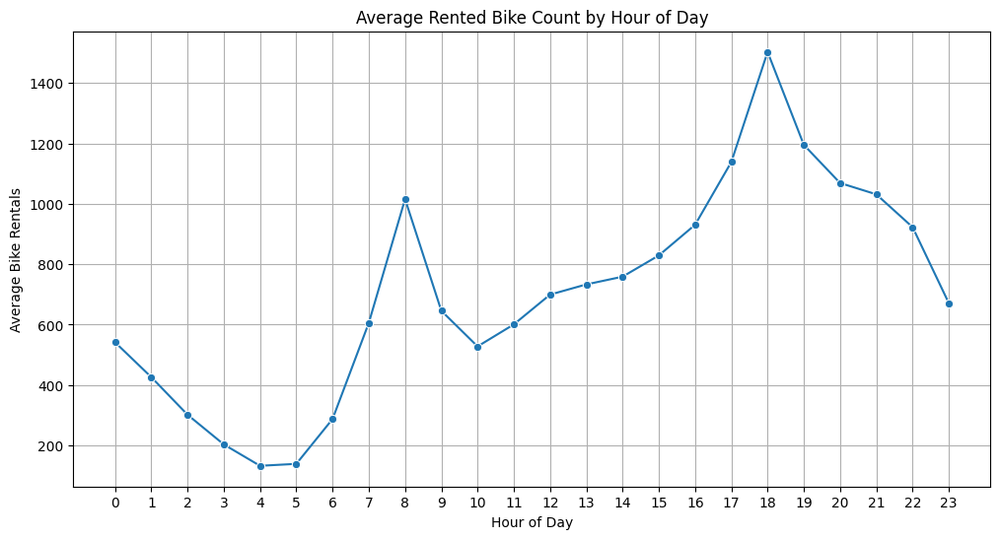

In [33]:
hourly_avg=dff.groupby('Hour')['Rented_Bike_Count'].mean()

plt.figure(figsize=(12,6))
sns.lineplot(x=hourly_avg.index,y=hourly_avg.values,marker='o')
plt.title("Average Rented Bike Count by Hour of Day")
plt.xlabel("Hour of Day")
plt.ylabel("Average Bike Rentals")
plt.grid(True)
plt.xticks(range(0,24))
plt.show()

####  From above plot it is seen that a sudden increase from (6AM-8AM) and from (4PM-6PM)

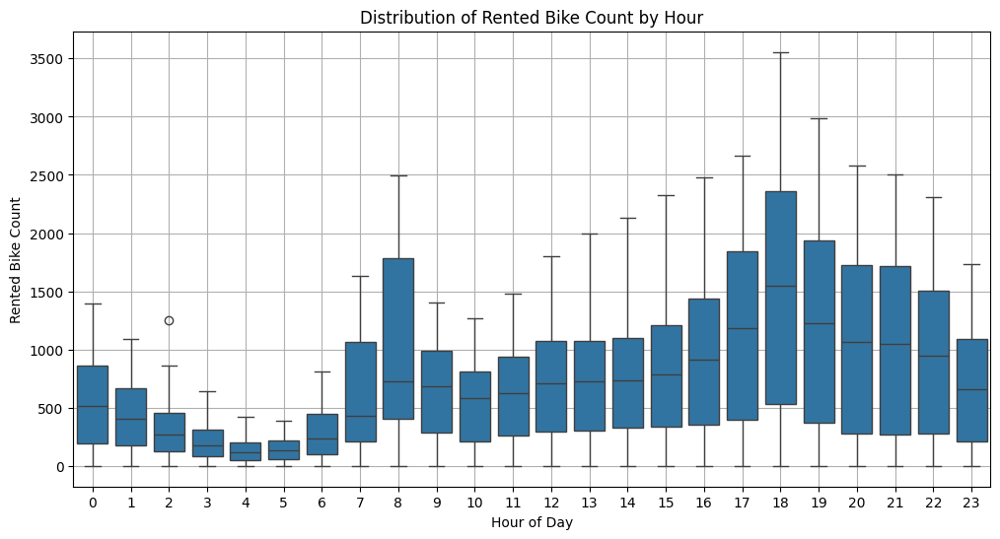

In [34]:
plt.figure(figsize=(12,6))
sns.boxplot(x='Hour',y='Rented_Bike_Count',data=dff)
plt.title("Distribution of Rented Bike Count by Hour")
plt.xlabel('Hour of Day')
plt.ylabel("Rented Bike Count")
plt.grid(True)
plt.show()

## Converting Hour into Morning,Afternoon, Night

In [35]:
dff['Time_Period']=df['Hour'].apply(lambda x:'Morning' if x<12 else 'Afternoon' if (x>=12)and (x<18) else 'Night')

In [36]:
dff.groupby('Time_Period')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns={'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count',ascending=False)

,Time_Period,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
2,Night,2333230,1065.401826,2190
1,Morning,1981296,452.350685,4380
0,Afternoon,1857788,848.305023,2190


In [37]:
dff['Time_Period'].value_counts()

Time_Period
Morning      4380
Afternoon    2190
Night        2190
Name: count, dtype: int64

### Checking the effect of visibility

In [38]:
dff_visibility=dff.groupby('Visibility')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns={'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count',ascending=False)

dff_visibility[:10]

,Visibility,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
1788,2000,1836690,818.124722,2245
1783,1995,26276,772.823529,34
1777,1989,22383,799.392857,28
1775,1987,21544,936.695652,23
1780,1992,21405,823.269231,26
1773,1985,19848,708.857143,28
1774,1986,19835,1043.947368,19
1784,1996,19547,723.962963,27
1786,1998,19518,780.720000,25
1778,1990,19495,847.608696,23


## Checking of Humidity

In [39]:
dff_humidity=dff.groupby('Humidity')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns={'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count',ascending=False)

dff_humidity[:10]

,Humidity,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
34,43,141773,864.469512,164
44,53,140725,813.439306,173
38,47,138105,885.288462,156
47,56,134711,858.031847,157
42,51,131966,851.393548,155
43,52,130054,867.026667,150
46,55,129240,891.310345,145
35,44,126969,857.898649,148
36,45,126234,888.971831,142
45,54,123762,819.615894,151


##### Finding skew and kurtosis
skew = measure of asymmetry of a distribution

kurtosis = quantify shape of a distribution

In [40]:
numeric_cols=dff.select_dtypes(include='number')
numeric_cols.agg(['skew','kurtosis']).T

,skew,kurtosis
Rented_Bike_Count,1.153428,0.853387
Hour,0.000000,-1.204176
Temperature,-0.198326,-0.837786
Humidity,0.059579,-0.803559
Wind_speed,0.890955,0.727179
Visibility,-0.701786,-0.961980
Dew_point_temperature,-0.367298,-0.755430
Solar_Radiation,1.504040,1.126433
Rainfall,14.533232,284.991099
Snowfall,8.440801,93.803324


## What all manipulations have you done and insights you found?
In order to start the analysis, I first started by making data more consistent i.e., I first changed column name to more readable format. Later I converted incorrect data type of date feature into datetime data type and then extracted month, year and day from date and then deleted the date feature. Based on the categorial feaure I calulated average and median for numerical values to undertand how it impact other features. Then finally I tried to find how bike demand is affected based on other features like visibility and humidity. I have also created two different columns, one by dividing day of week into working and weekend to check how bike demand was affected and then based on hour i divided enitre column in different time period to understand its affect.

▶ Insights from analysis:

People tends to use bike when company is functional i.e., for non functioning day bike rented was zero.
Demand for bike is affected if there is holiday.
Visibility shows linear relation with bike demand.
People prefer bike when there is moderate humidity 30-55.
With change in seasons, demand for bike also changes. Maximum when summer and minium when winter.

## Data visualization,Storytelling & Experimenting with charts:

#### Understand the relationships between variables

##### separting Categorical and numerical columns


In [41]:
num_feature=dff.select_dtypes(exclude='object')
num_feature.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Year'],
      dtype='object')

In [42]:
cat_feature=dff.select_dtypes(exclude='number')
cat_feature.columns

Index(['Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day', 'Week',
       'Time_Period'],
      dtype='object')

### Checking outliers using box plot

In [43]:
def box_plot(dff,feature):
    for i,col in enumerate(feature.columns):
        plt.figure(figsize=(20,25))
        if dff[col].dtypes=='object':
            plt.subplot(4,2,i+1);
            sns.boxplot(x=dff[col],y=dff['Rented_Bike_Count']);
            plt.xticks(fontsize=18,rotation=90);
        else:
            plt.subplot(6,2,i+1);
            sns.boxplot(dff[col]);
        plt.tight_layout();

In [44]:
from scipy.stats import norm
def density_plot(dfr,feature):
    graph=plt.figure(figsize=(20,30))
    for i,col in enumerate(num_feature):
        sns.set_style("ticks")
        sns.set_context("poster");
        plt.subplot(6,2,i+1);
        sns.histplot(dfr[col],kde=True,stat='density',color='#055E85');
        feature=dfr[col]
        plt.axvline(feature.mean(),color='#ff033e',linestyle='dashed',linewidth=3,label='mean');#red
        plt.axvline(feature.median(),color='#A020F0',linestyle='dashed',linewidth=3,label='median');#cyan
        plt.title(f"{col.title()}");
        plt.tight_layout();

# Univariate(Separate features visualization)

## Density plot

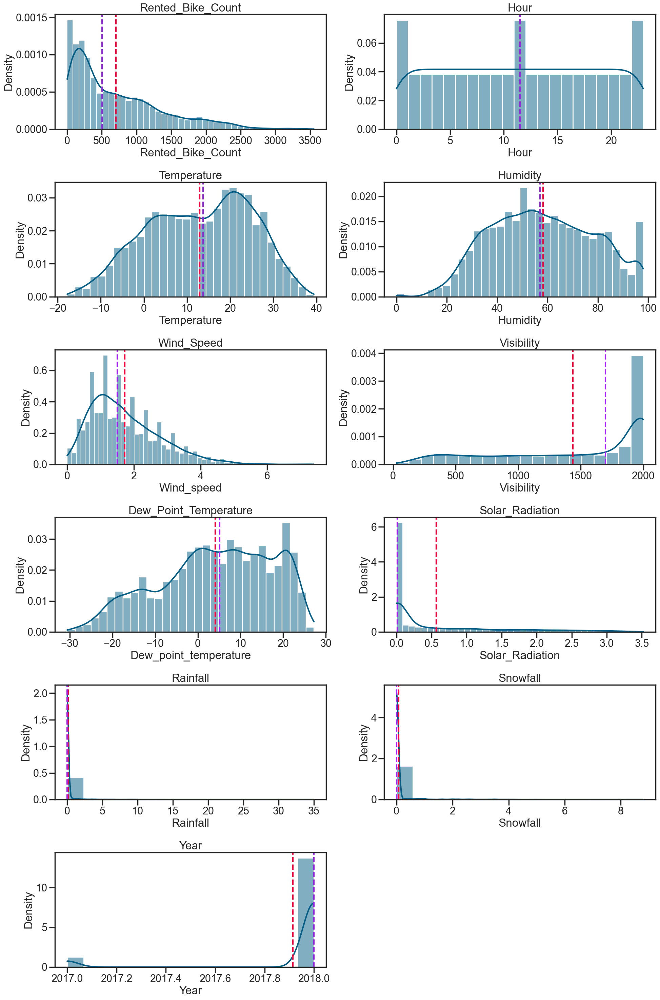

In [45]:
density_plot(dff,num_feature)

## Chart 1- Understanding the distribution
 Q.1 :What is/are the insight(s) found from the chart?
Right/Positive Skewed Distribution: Mode < Median < Mean: Rented_Bike_Count, Wind_speed, Solar Radiation

No Skew: Mean = Median = Mode : Hour, Temperature, Humidity,Rainfall,Snowfall

Left/Negative Skewed Distribution: Mean < Median < Mode: visibility

Q.2: Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

In this context it can not define any business impact. It's done just to see the distribution of the column data over the dataset.

## Checking the outliers using boxplot

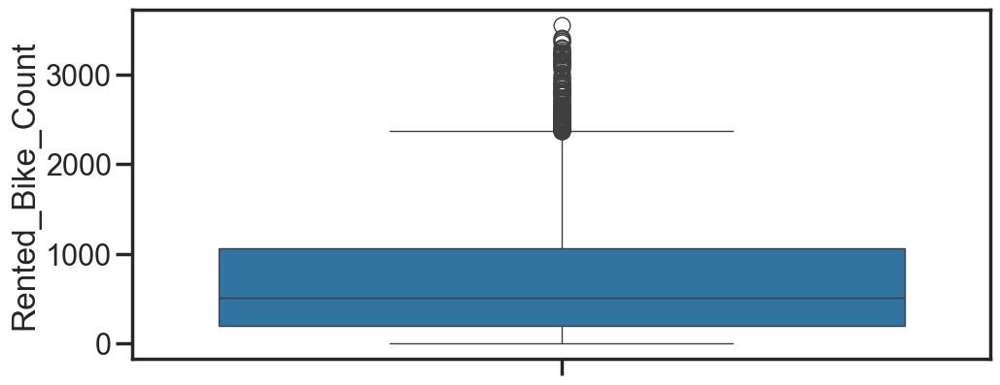

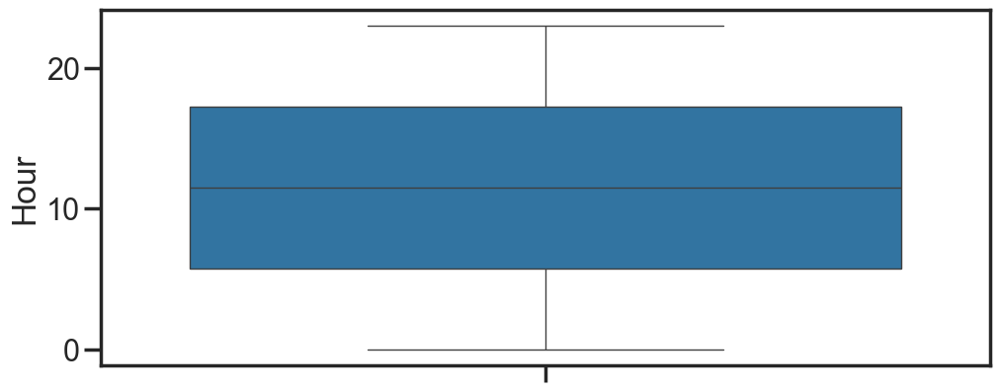

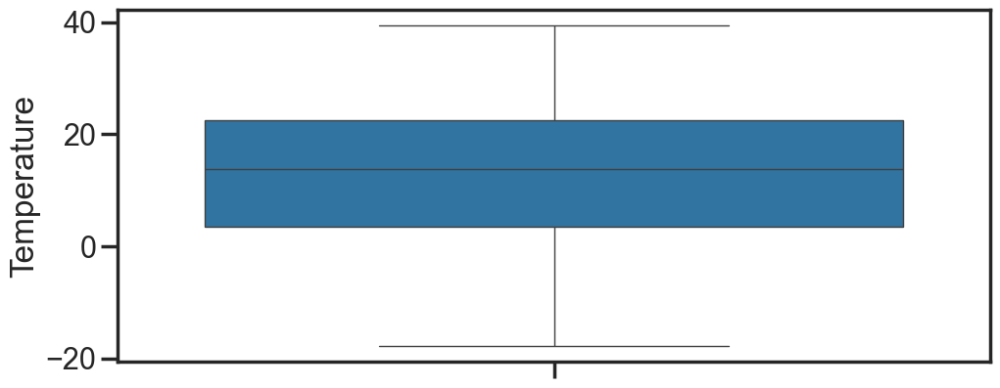

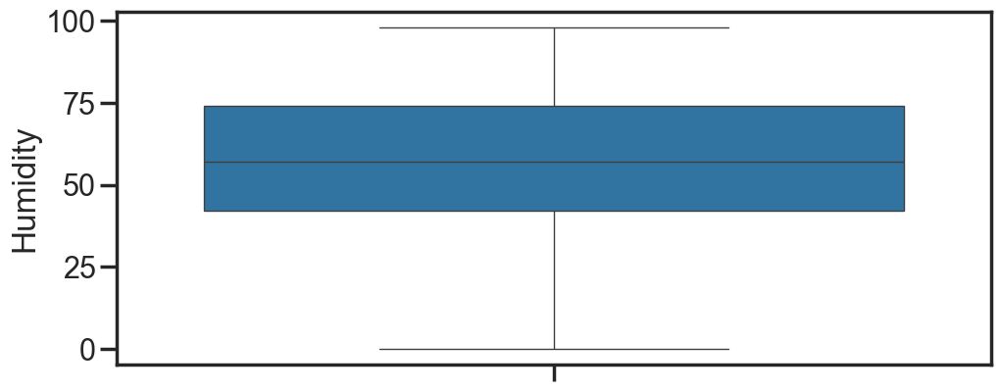

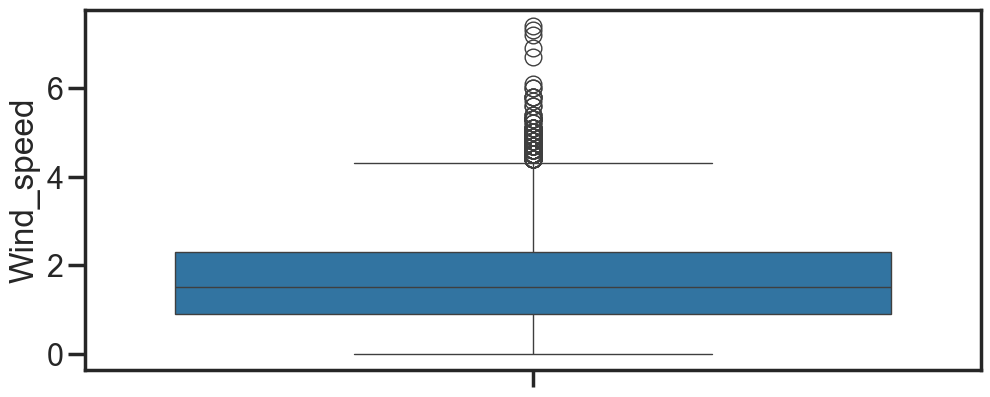

...

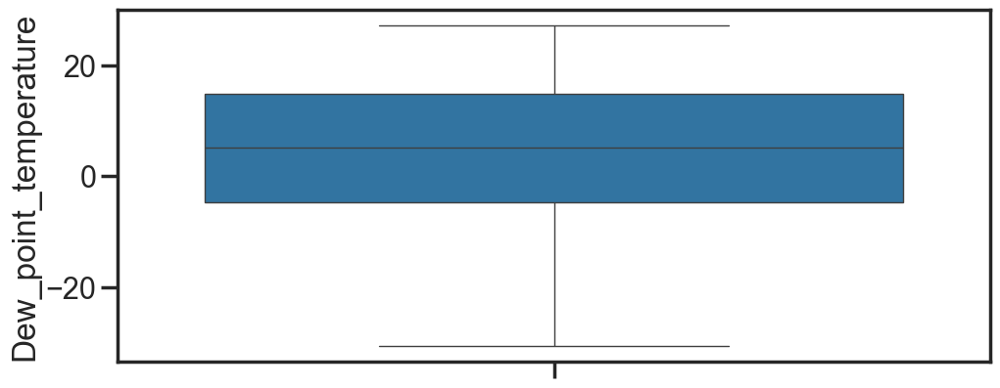

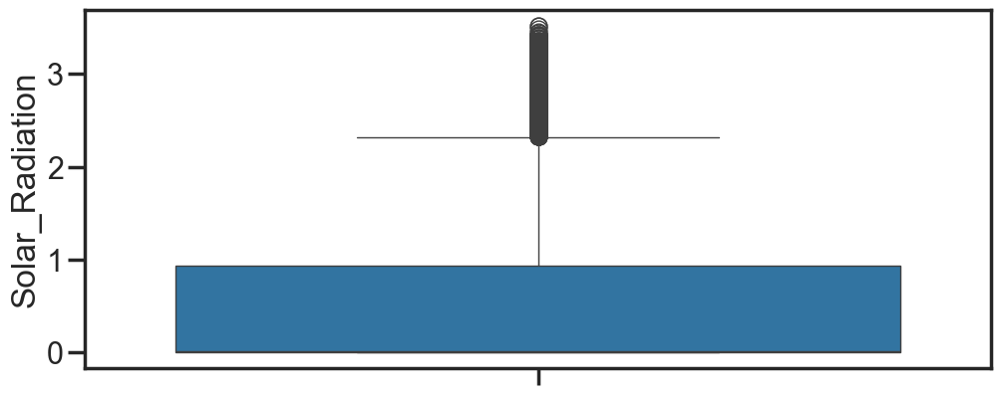

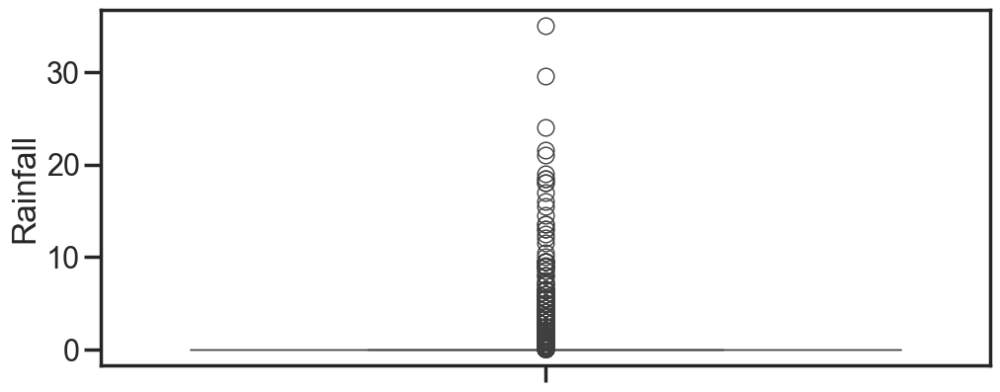

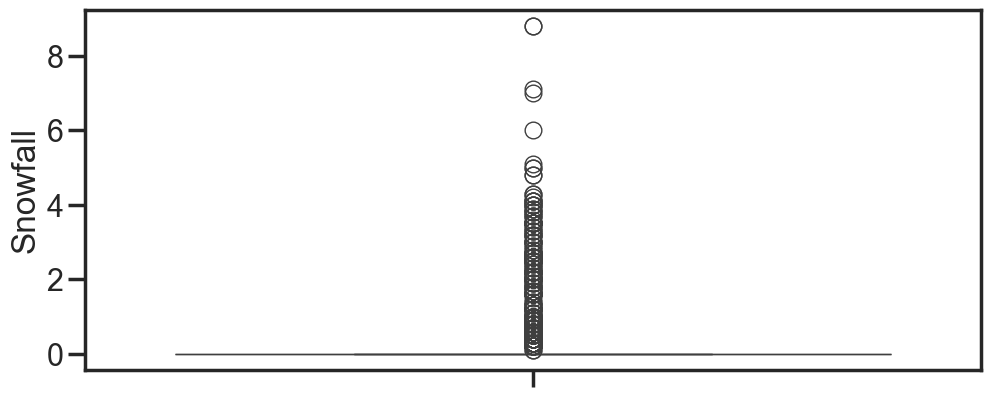

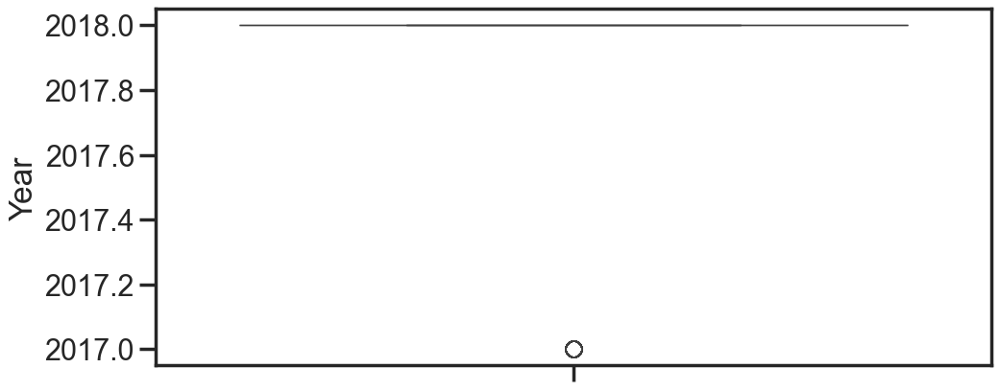

In [46]:
box_plot(dff,num_feature)

## Chart 2- Visualization of Outliers

Q.1:What is/are the insight(s) found from the chart?
In rented bike count feature there are few points accumulated above maximum range.
Feature like snowfall and rainfall show sparse data as there are more number of values which is zero i.e., upto 75 quartile.

Q.2:Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Box plot alone can not provide any business impact, plotted only to visulize distribution and understanding of anamolies.

# Bivariate visualization

##### comparing different feature with bike count

#### Barplot visualization (Seasons,Month,Year)

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\2637371717.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=dff,x='Seasons',y='Rented_Bike_Count',estimator='mean',palette='viridis')


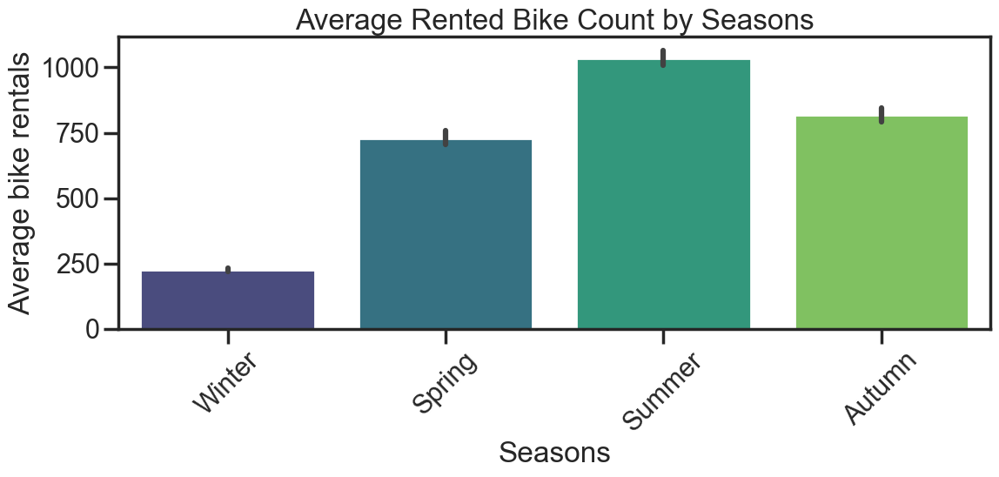

In [47]:
#for seasons

plt.figure(figsize=(12,6))
sns.barplot(data=dff,x='Seasons',y='Rented_Bike_Count',estimator='mean',palette='viridis')
plt.title('Average Rented Bike Count by Seasons')
plt.xlabel('Seasons')
plt.ylabel('Average bike rentals')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### From above plot it is seen that the Demand is high in (Summer) and low in (Winter)

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\3010940860.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=dff,x='Month',y='Rented_Bike_Count',estimator='mean',palette='viridis')


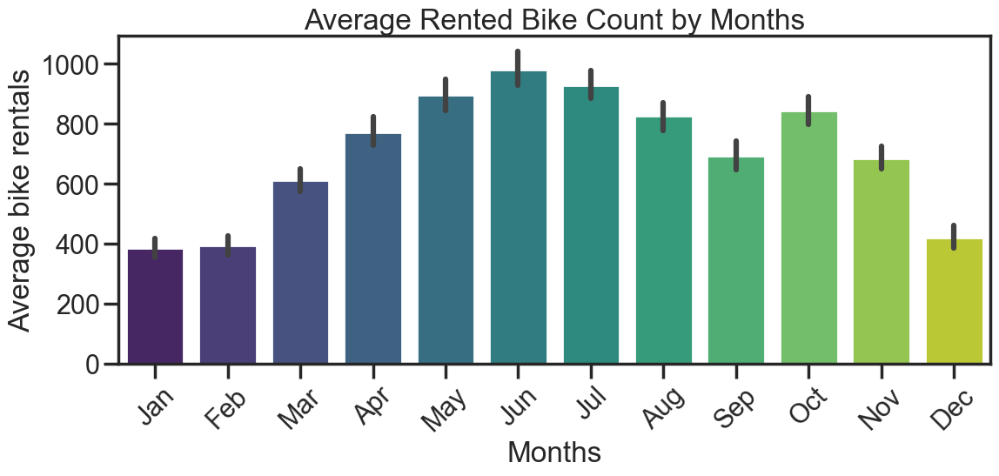

In [48]:
#for months

plt.figure(figsize=(12,6))
sns.barplot(data=dff,x='Month',y='Rented_Bike_Count',estimator='mean',palette='viridis')
plt.title('Average Rented Bike Count by Months')
plt.xlabel('Months')
plt.ylabel('Average bike rentals')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### From above plot it is seen that there is increase of bike demand from jan to jun than slight decrease to aug then increase in sep and then decrease started from oct to dec

####### Such that the highest demand in Jun and lowest in Jan

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\3391386690.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=dff,x='Year',y='Rented_Bike_Count',estimator='mean',palette='viridis')


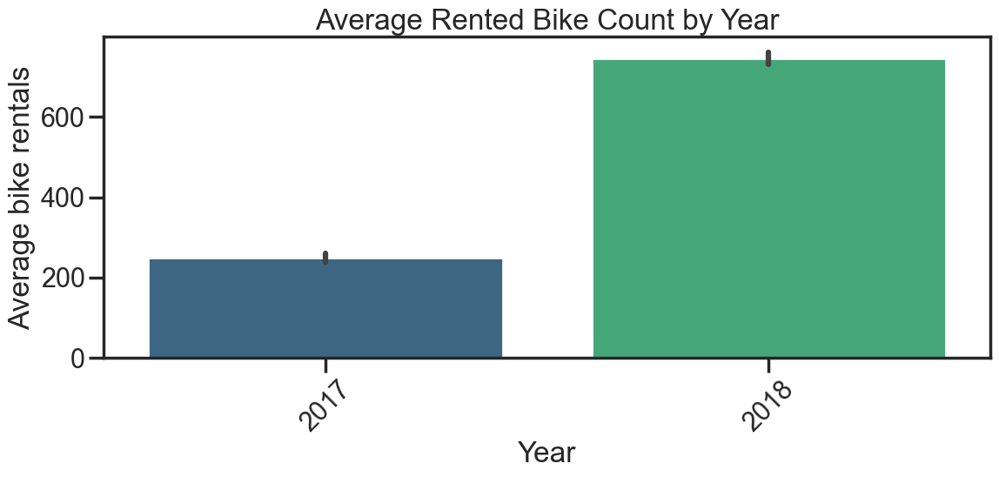

In [49]:
#for year

plt.figure(figsize=(12,6))
sns.barplot(data=dff,x='Year',y='Rented_Bike_Count',estimator='mean',palette='viridis')
plt.title('Average Rented Bike Count by Year')
plt.xlabel('Year')
plt.ylabel('Average bike rentals')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## From above it has been clearly seen that the demand has increased.

## Visualization through Pie chart (FUnctioning_Day,Holiday,Week,Time_Period)

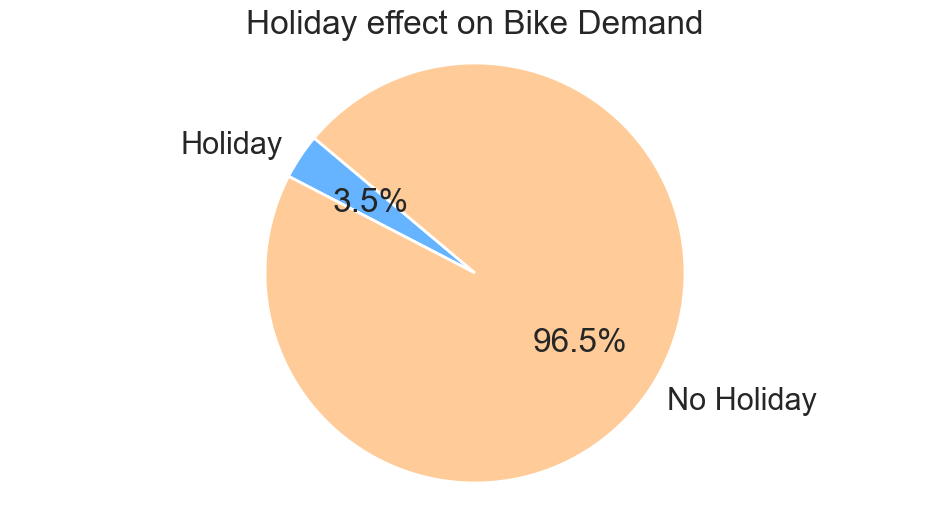

In [50]:
#for Holiday

holiday_bike_counts=dff.groupby('Holiday')['Rented_Bike_Count'].sum()

plt.figure(figsize=(12,6))
plt.pie(holiday_bike_counts,labels=holiday_bike_counts.index,autopct='%1.1f%%',startangle=140,colors=['#66b3ff','#ffcc99'])
plt.title("Holiday effect on Bike Demand")
plt.axis('equal')
plt.show()

##### It is seen that the demand on holiday if low

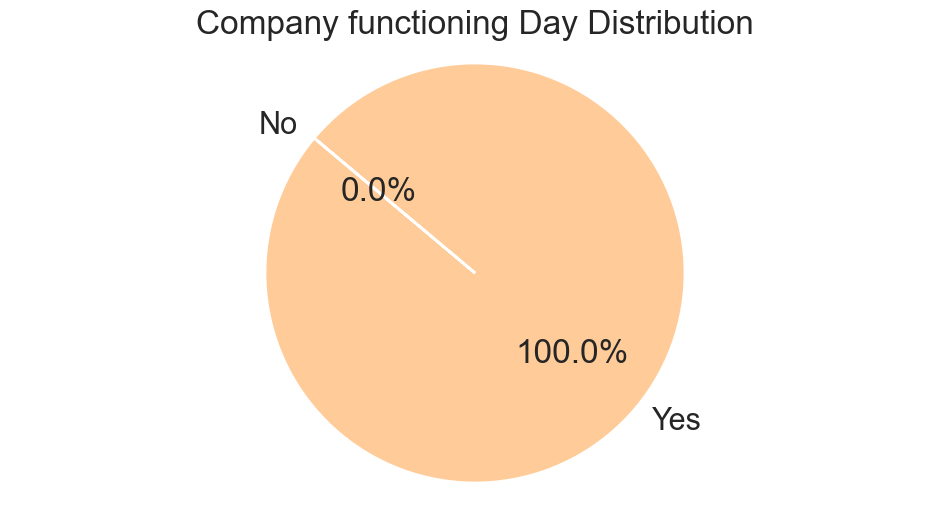

In [51]:
# Functioning_Day

functioning_day_bike_counts=dff.groupby('Functioning_Day')['Rented_Bike_Count'].sum()

plt.figure(figsize=(12,6))
plt.pie(functioning_day_bike_counts,labels=functioning_day_bike_counts.index,autopct='%1.1f%%',startangle=140,colors=['#66b3ff','#ffcc99'])
plt.title("Company functioning Day Distribution")
plt.axis('equal')
plt.show()

##### Here the company should focus only on functioning Day

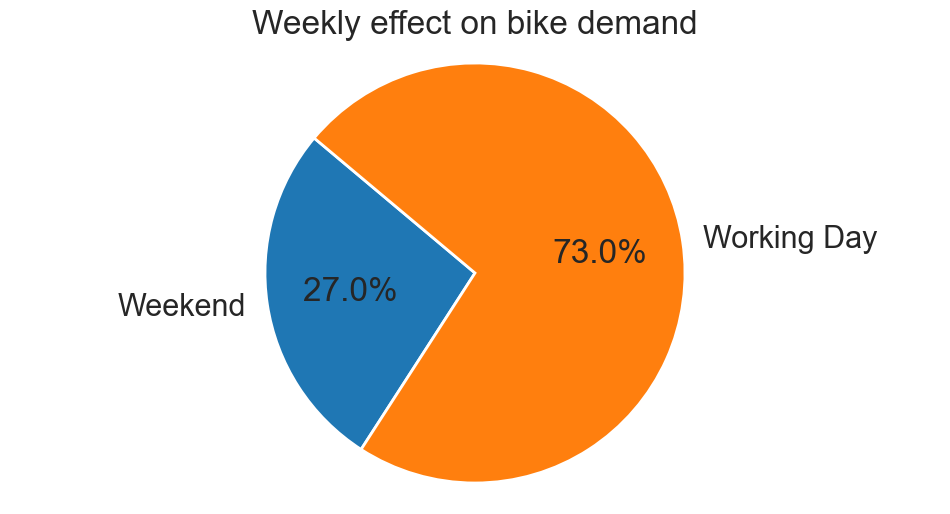

In [52]:
# Pie chart for Week

week_bike_counts=dff.groupby('Week')['Rented_Bike_Count'].sum()

plt.figure(figsize=(12,6))
plt.pie(week_bike_counts,labels=week_bike_counts.index,autopct='%1.1f%%',startangle=140)
plt.title("Weekly effect on bike demand")
plt.axis('equal')
plt.show()

##### Here it is noticable that the bike demand is higher on working day as compare to weekend

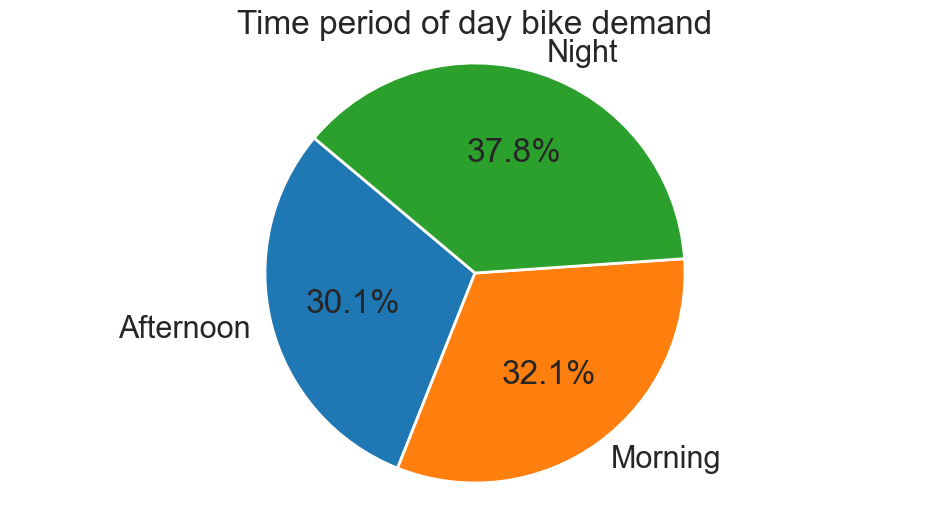

In [53]:
# for Time-Period
timing_bike_counts=dff.groupby('Time_Period')['Rented_Bike_Count'].sum()

plt.figure(figsize=(12,6))
plt.pie(timing_bike_counts,labels=timing_bike_counts.index,autopct='%1.1f%%',startangle=140)
plt.title("Time period of day bike demand")
plt.axis('equal')
plt.show()

#### Here more such effect is not noticeble such as demand is something similar

## Lineplot for 'Day of Week'

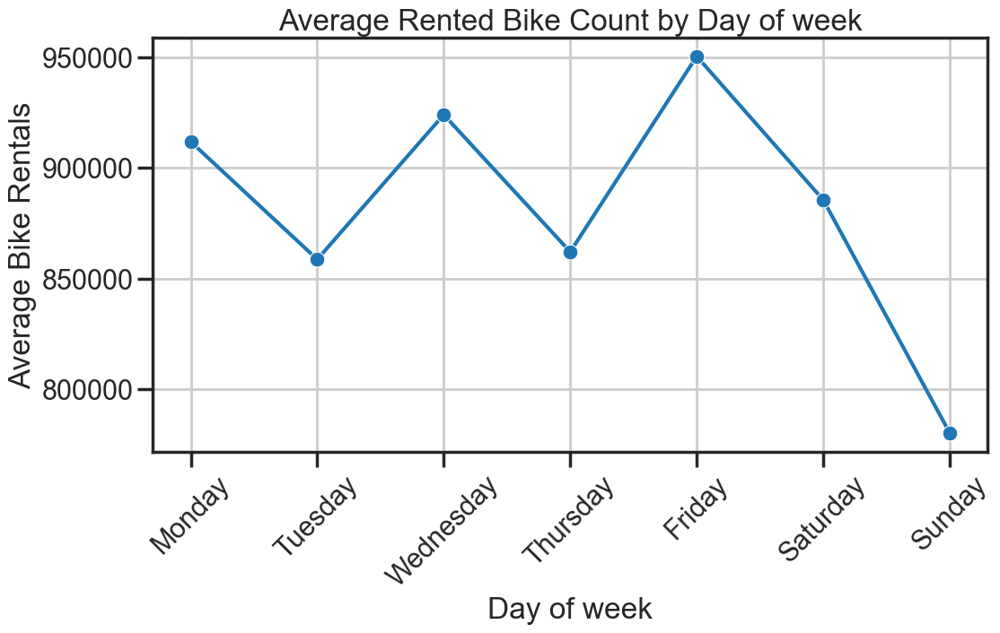

In [54]:
weekly_avg=dff.groupby('Day')['Rented_Bike_Count'].sum()
day_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
weekly_avg=weekly_avg.reindex(day_order)

plt.figure(figsize=(12,6))
sns.lineplot(x=weekly_avg.index,y=weekly_avg.values,marker='o')
plt.title("Average Rented Bike Count by Day of week")
plt.xlabel("Day of week")
plt.ylabel("Average Bike Rentals")
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

#### Here it is seen that the lowest is on Sunday and highest is on friday and also after workingdays the demand decreases flowlessly

## Lineplot of Hour of Day

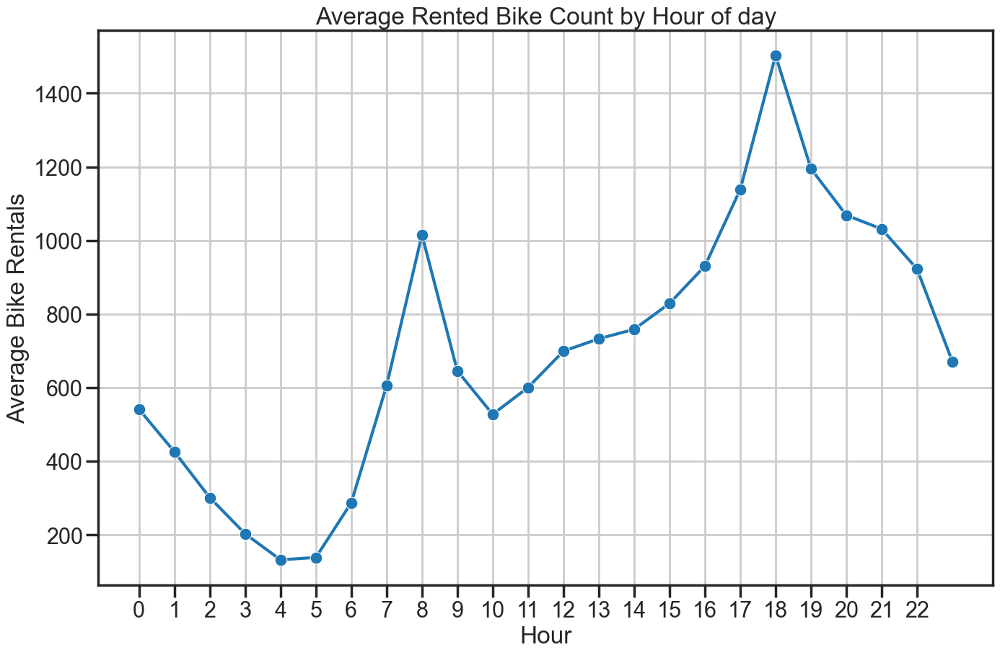

In [55]:
hour_avg=dff.groupby('Hour')['Rented_Bike_Count'].mean()

plt.figure(figsize=(16,10))
sns.lineplot(x=hour_avg.index,y=hour_avg.values,marker='o')
plt.title("Average Rented Bike Count by Hour of day")
plt.xlabel("Hour")
plt.ylabel("Average Bike Rentals")
plt.grid(True)
plt.xticks(range(0,23))
plt.show()

### Here it is noticable that between 7AM to 9AM in morning and 5PM to 7PM in the night the demand is quite high.

# Environmental factors visualization

## Let us plot scatterplot with correlation for visualizing remaining variables w.r.t rented bike count or bike demand

In [56]:
from scipy.stats import pearsonr

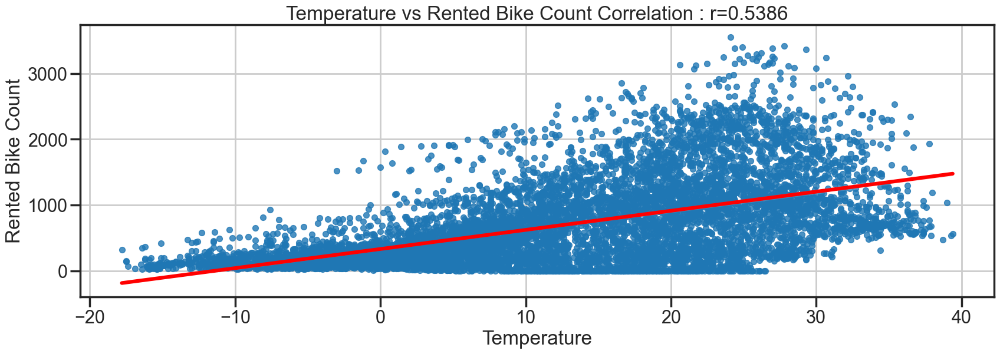

In [57]:
# Temperature w.r.t. rented bike count

corr, _ =pearsonr(dff['Temperature'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Temperature',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Temperature vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Temperature')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

#### Here we can conclude that temp. 20-35 has max demand.

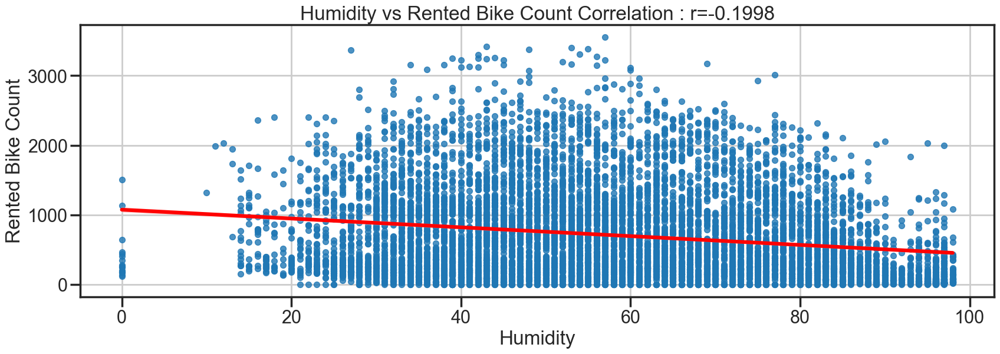

In [58]:
# Humidity w.r.t. rented bike count

corr, _ =pearsonr(dff['Humidity'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Humidity',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Humidity vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Humidity')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

### Here the correlation show the negative impact and it show when the humidity is moderate it perfoms well.

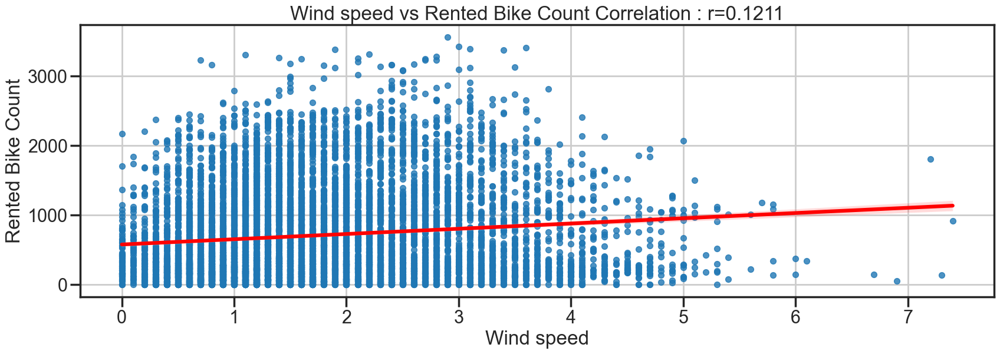

In [59]:
# Wind speed w.r.t. rented bike count

corr, _ =pearsonr(dff['Wind_speed'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Wind_speed',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Wind speed vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Wind speed')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

#### Here it is seen that if the wind speed is low than the demand is high.

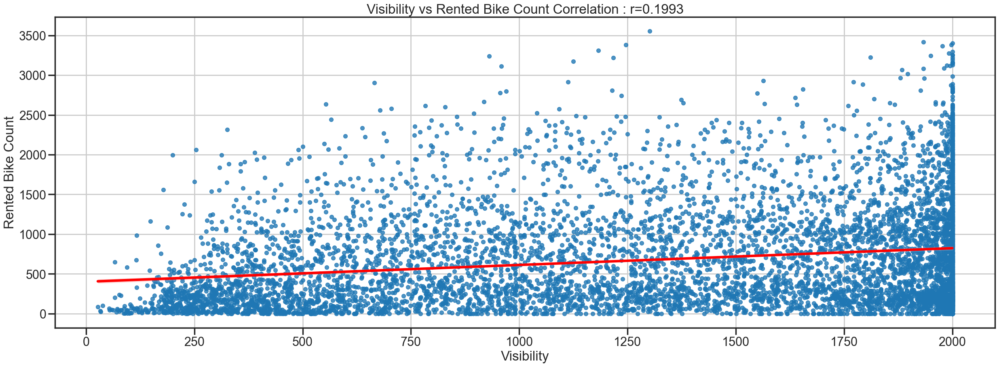

In [60]:
# Visibility w.r.t. rented bike count

corr, _ =pearsonr(dff['Visibility'],dff['Rented_Bike_Count'])

plt.figure(figsize=(30,10))
sns.regplot(x='Visibility',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Visibility vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Visibility')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

## Here High visibility demand is more (2000)

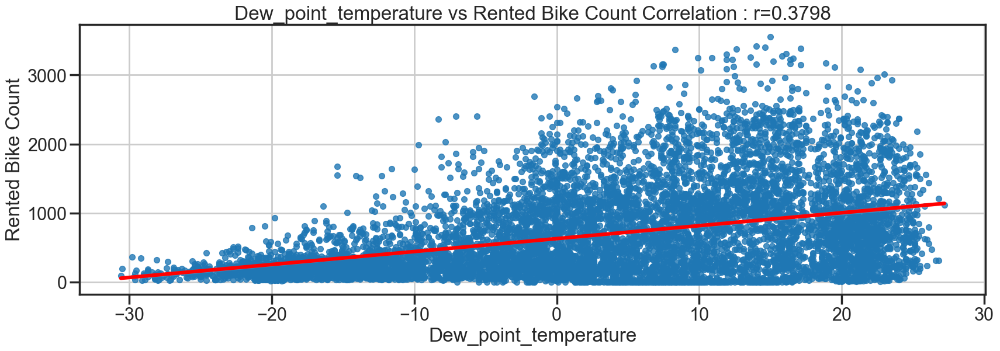

In [61]:
# Dew point temperature w.r.t. rented bike count

corr, _ =pearsonr(dff['Dew_point_temperature'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Dew_point_temperature',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Dew_point_temperature vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Dew_point_temperature')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

#### Moderate temperature maximum demand

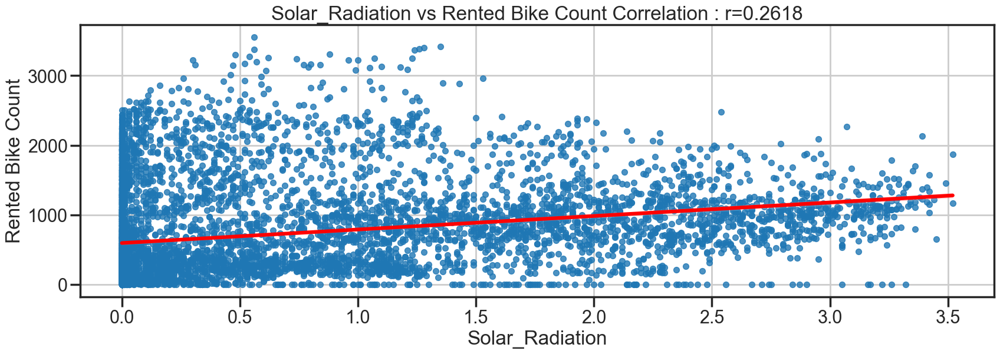

In [62]:
# Solar radiation w.r.t. rented bike count

corr, _ =pearsonr(dff['Solar_Radiation'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Solar_Radiation',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Solar_Radiation vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Solar_Radiation')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

#### When solar radiation is low demand is high.

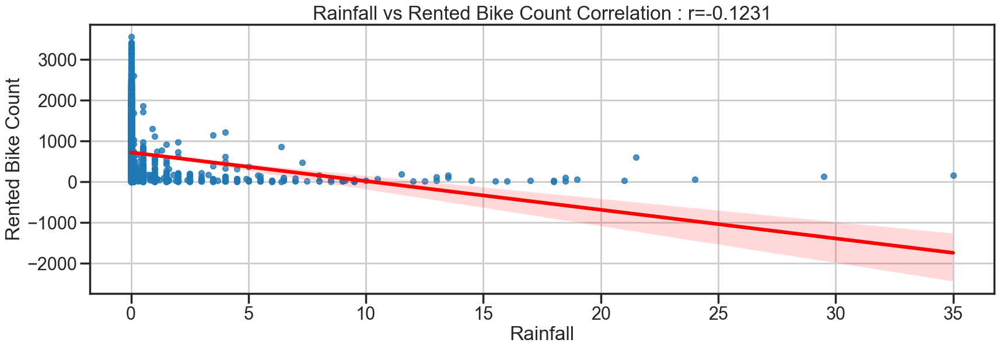

In [63]:
# Rainfall w.r.t. rented bike count

corr, _ =pearsonr(dff['Rainfall'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Rainfall',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Rainfall vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Rainfall')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

#### Here we define the negative linear relation results such rainfall is low demand is high.

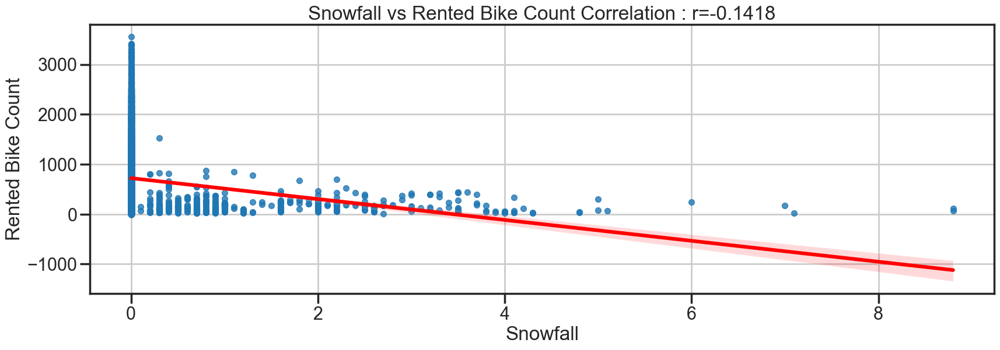

In [64]:
# Snowfall w.r.t. rented bike count

corr, _ =pearsonr(dff['Snowfall'],dff['Rented_Bike_Count'])

plt.figure(figsize=(20,6))
sns.regplot(x='Snowfall',y='Rented_Bike_Count',data=dff,scatter_kws={'s':50},line_kws={'color':'red'})
plt.title(f"Snowfall vs Rented Bike Count Correlation : r={corr:.4f}")
plt.xlabel('Snowfall')
plt.ylabel('Rented Bike Count')
plt.grid(True)
plt.show()

#### Same as rainfall low or no snowfall demand is high

## Now we plot the box plot for categorical features (Seasons,Month,week,Day,Holiday,Functioning_Day)

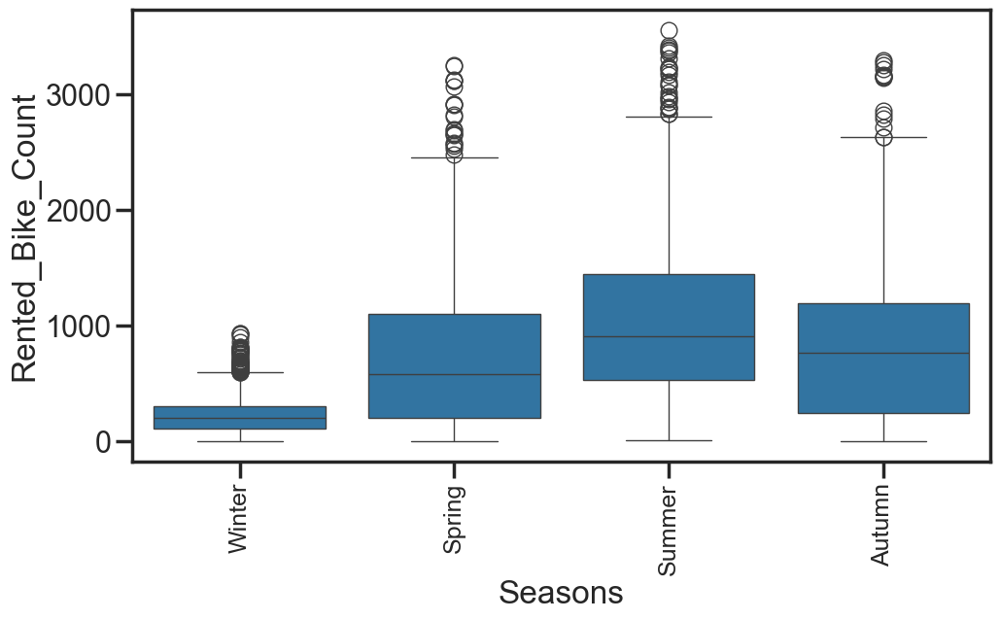

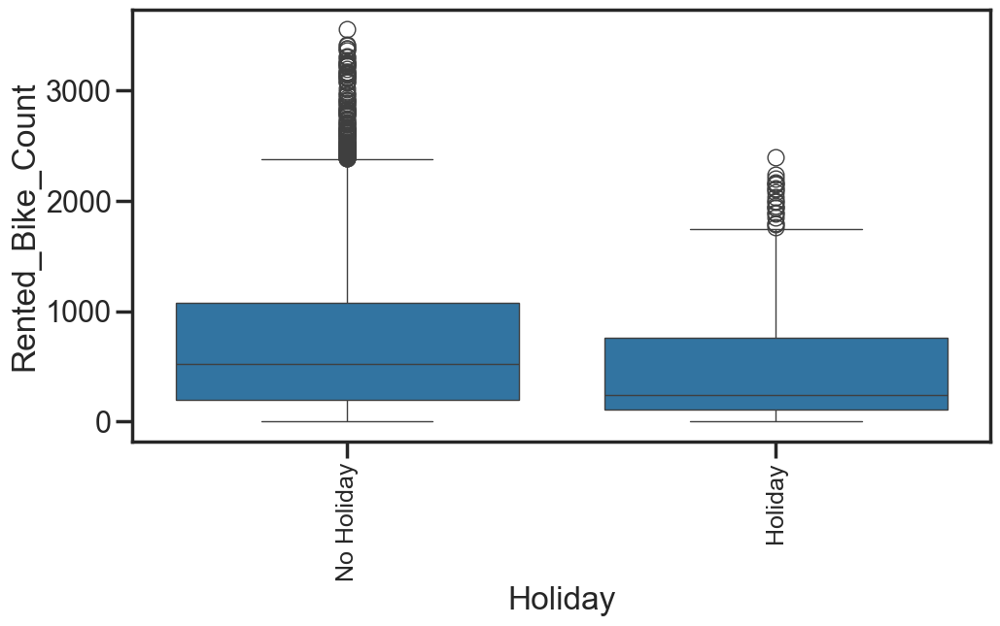

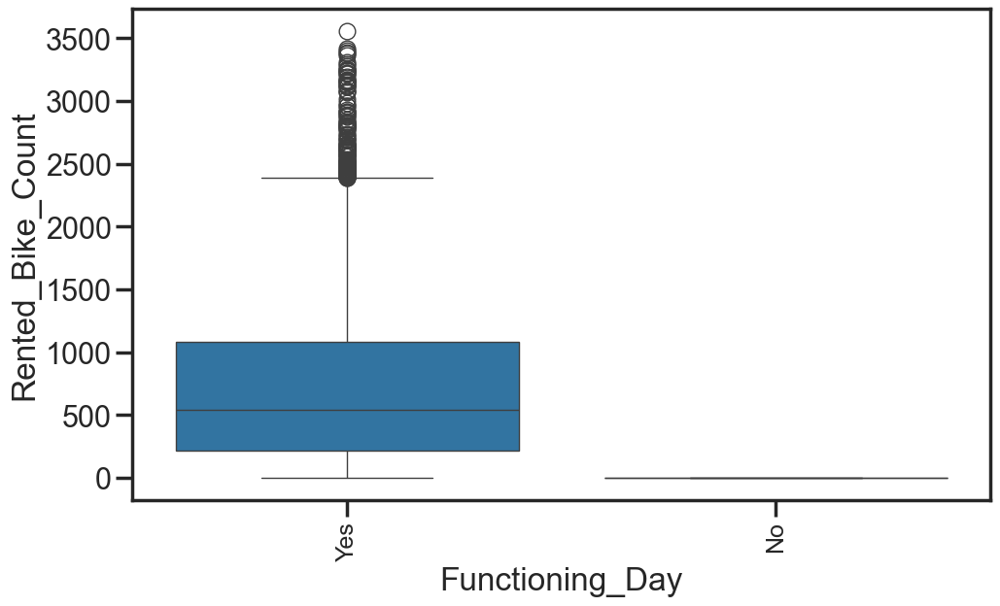

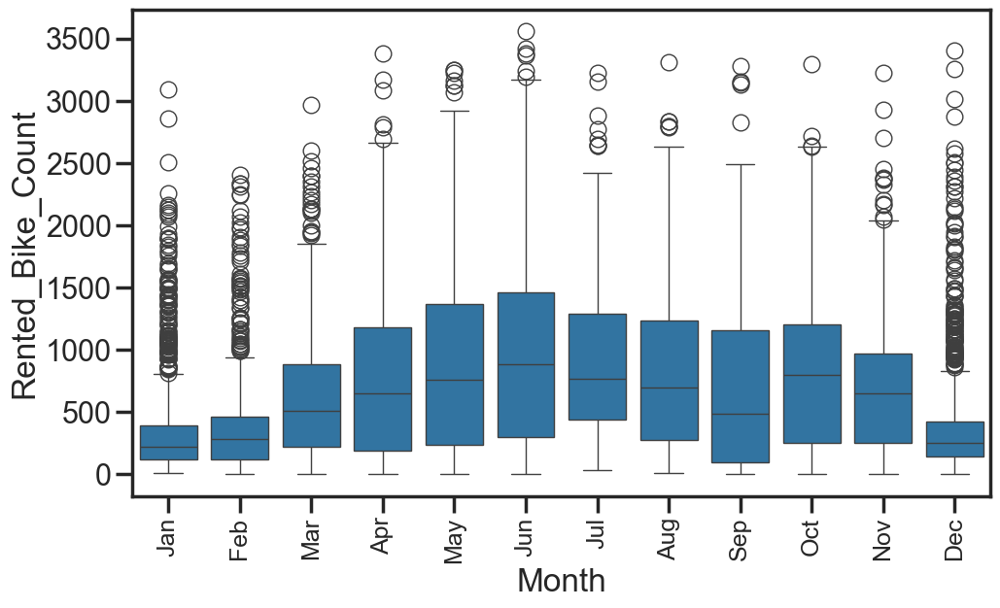

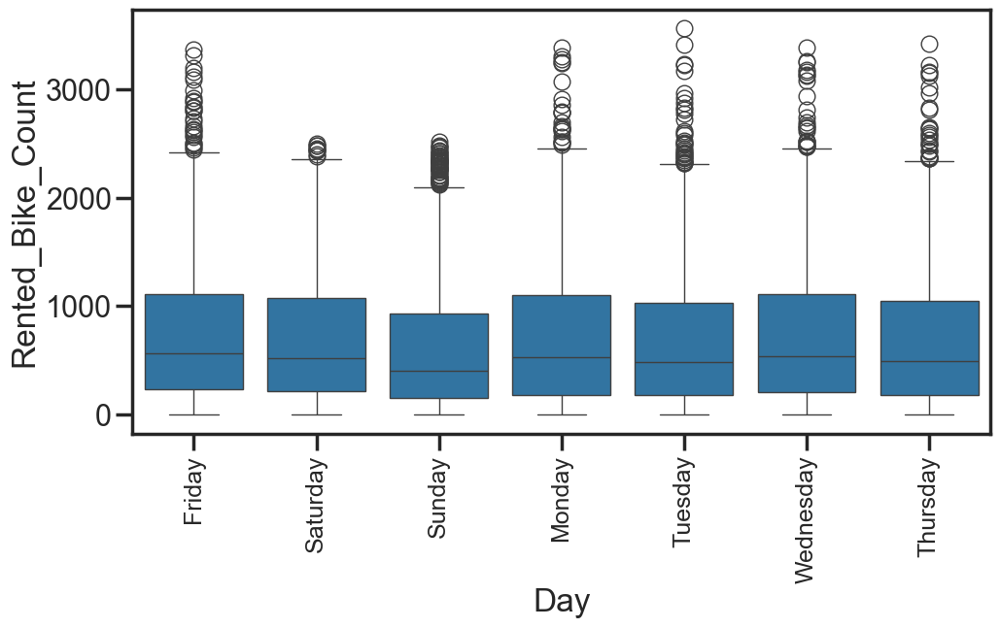

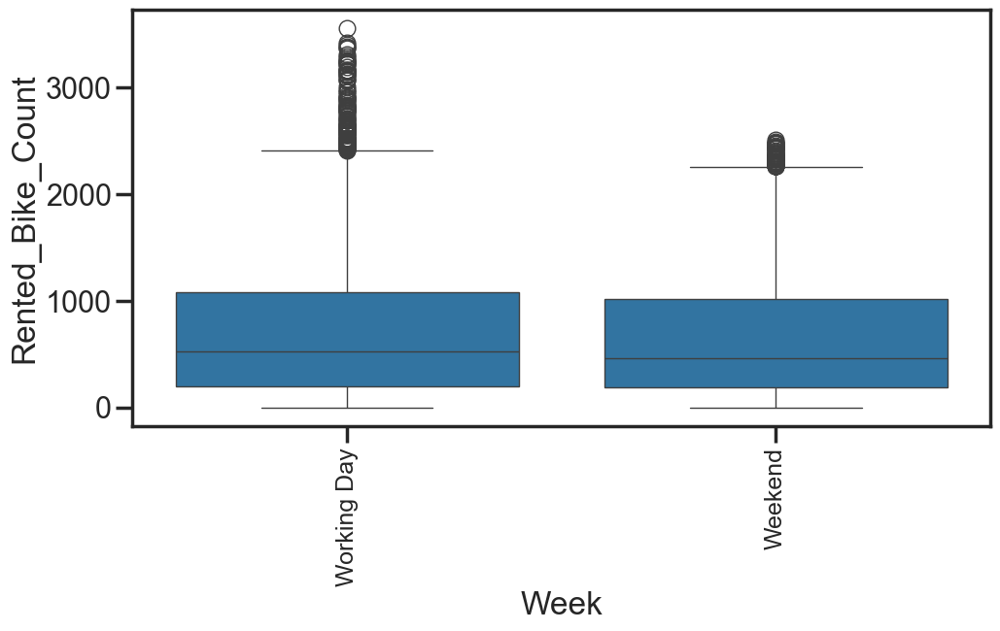

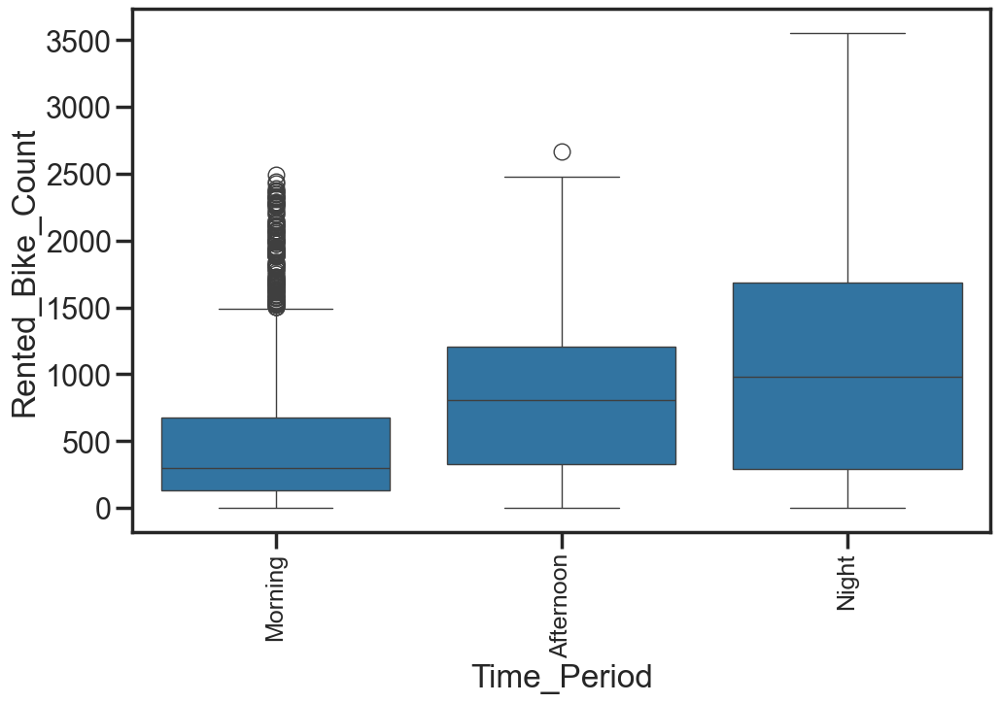

In [65]:
box_plot(dff,cat_feature)

# Multivariate visualization

#### Bike demand count w.r.t Hour in each seasons

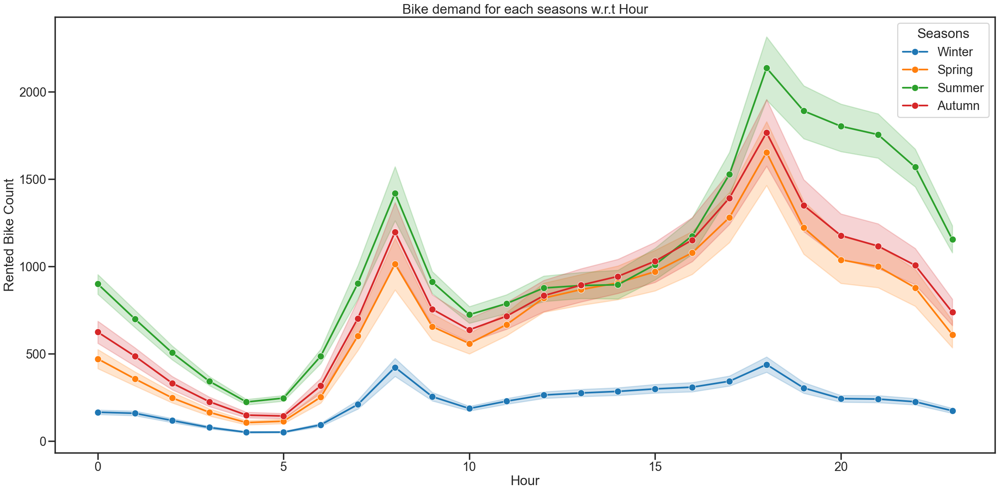

In [66]:
plt.figure(figsize=(30,14))
sns.lineplot(x=dff['Hour'],y=dff['Rented_Bike_Count'],hue=dff['Seasons'],marker='o')
plt.title("Bike demand for each seasons w.r.t Hour")
plt.xlabel("Hour")
plt.ylabel("Rented Bike Count")
plt.show()

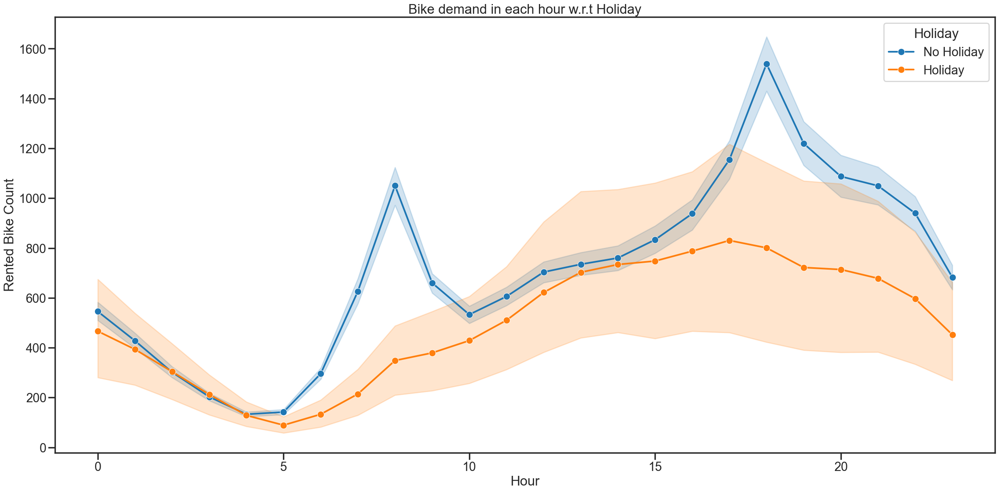

In [67]:
# Holiday
plt.figure(figsize=(30,14))
sns.lineplot(x=dff['Hour'],y=dff['Rented_Bike_Count'],hue=dff['Holiday'],marker='o')
plt.title("Bike demand in each hour w.r.t Holiday")
plt.xlabel("Hour")
plt.ylabel("Rented Bike Count")
plt.show()

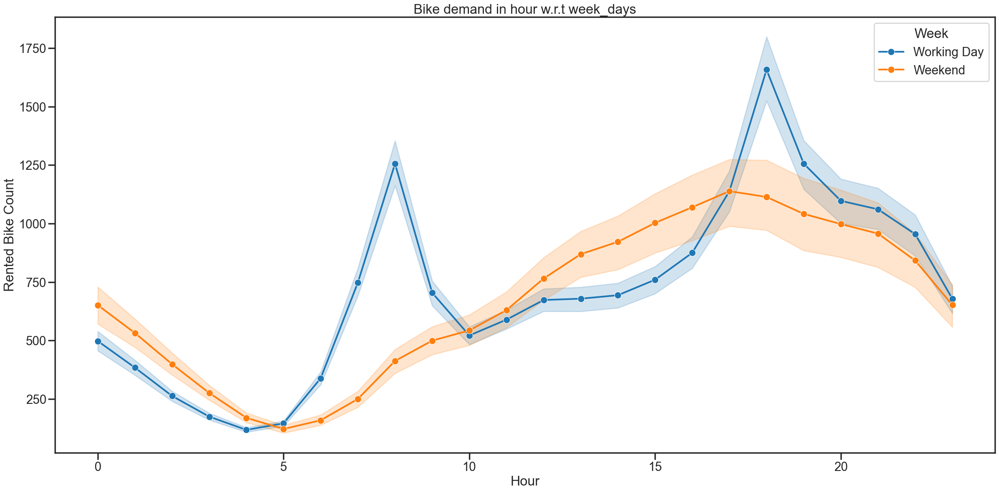

In [68]:
# Week
plt.figure(figsize=(30,14))
sns.lineplot(x=dff['Hour'],y=dff['Rented_Bike_Count'],hue=dff['Week'],marker='o')
plt.title("Bike demand in hour w.r.t week_days")
plt.xlabel("Hour")
plt.ylabel("Rented Bike Count")
plt.show()

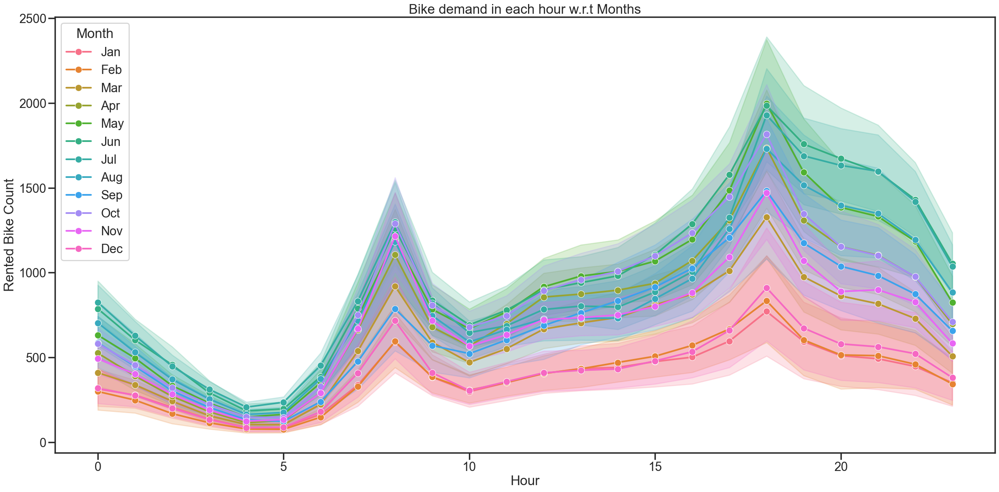

In [69]:
# Months
plt.figure(figsize=(30,14))
sns.lineplot(x=dff['Hour'],y=dff['Rented_Bike_Count'],hue=dff['Month'],marker='o')
plt.title("Bike demand in each hour w.r.t Months")
plt.xlabel("Hour")
plt.ylabel("Rented Bike Count")
plt.show()

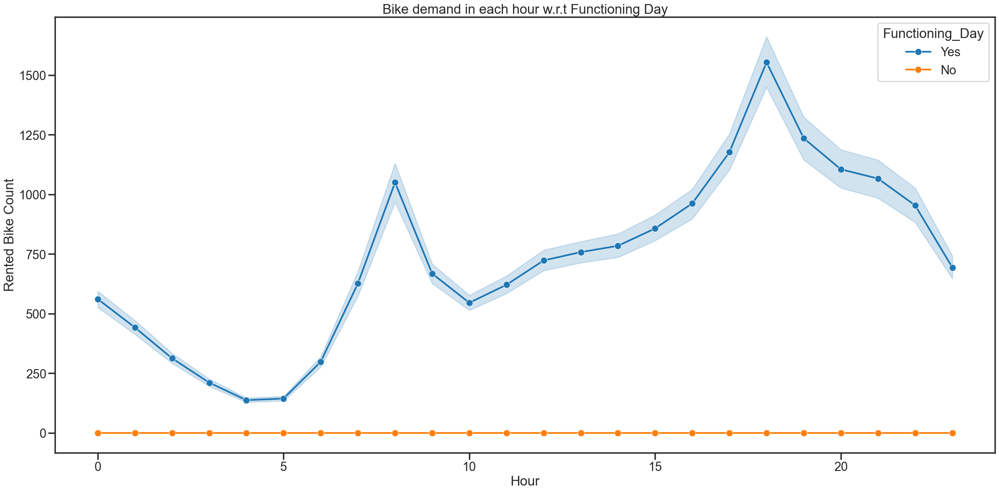

In [70]:
# Functioning Day
plt.figure(figsize=(30,14))
sns.lineplot(x=dff['Hour'],y=dff['Rented_Bike_Count'],hue=dff['Functioning_Day'],marker='o')
plt.title("Bike demand in each hour w.r.t Functioning Day")
plt.xlabel("Hour")
plt.ylabel("Rented Bike Count")
plt.show()

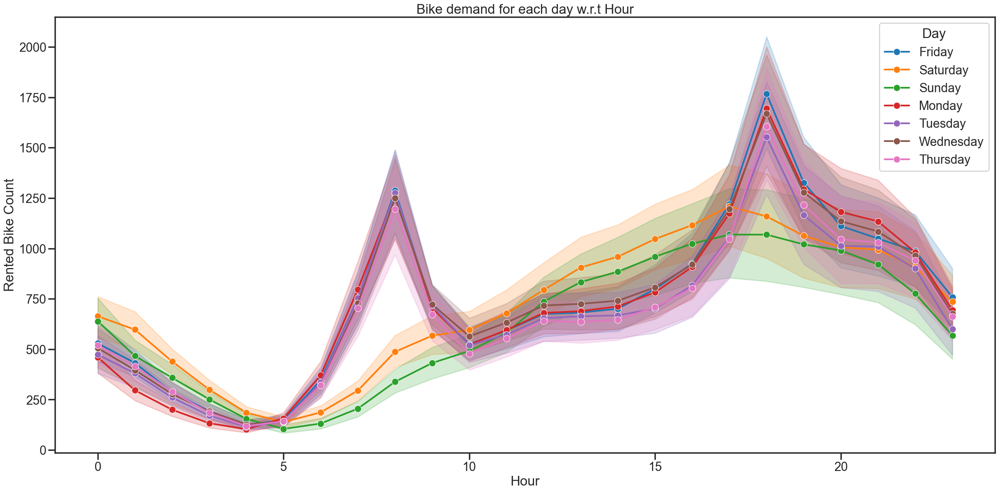

In [71]:
# Days of week
plt.figure(figsize=(30,14))
sns.lineplot(x=dff['Hour'],y=dff['Rented_Bike_Count'],hue=dff['Day'],marker='o')
plt.title("Bike demand for each day w.r.t Hour")
plt.xlabel("Hour")
plt.ylabel("Rented Bike Count")
plt.show()

# Defining Correlation using Heatmap

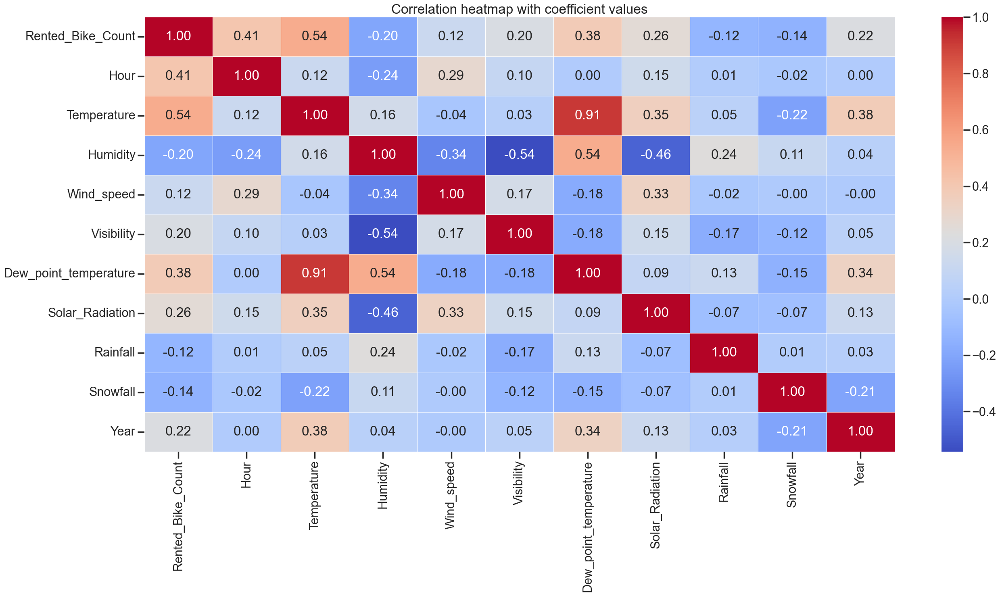

In [72]:
corr_matrix=num_feature.corr()
plt.figure(figsize=(30,14))
sns.heatmap(corr_matrix,annot=True,fmt=".2f",cmap='coolwarm',linewidth=0.5)
plt.title("Correlation heatmap with coefficient values")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

# Hypothis Testing
Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

## Hypothetical Statement-1
There is no difference in the mean number of rented bikes between different hours of the day.

#### Assumptions:
Null hypothesis: There is no difference in the mean number of rented bikes between different hours of the day.

Alternative hypothesis: There is a difference in the mean number of rented bikes between different hours of the day.

Test type : ANOVA test

In [73]:
null_hypothesis_H0="There is no difference in the mean number of rented bikes between different hours of the day."
alternative_hypothesis_Ha="There is a difference in the mean number of rented bikes between different hours of the day."

In [74]:
#Grouping the data by hour
data_by_hour=dff.groupby('Hour')

In [75]:
#Calculating the mean number of rented bikes for each hour
means=data_by_hour['Rented_Bike_Count'].mean()

In [76]:
#Performing the ANOVA test
from scipy import stats
F,p=stats.f_oneway(*[data_by_hour['Rented_Bike_Count'].get_group(hour) for hour in data_by_hour.groups])

In [77]:
#Printing the results
print(f"F-statistics:{F:.3f}")
print(f"p-value:{p:.3f}")

if p<0.05:
    print(f"{alternative_hypothesis_Ha} (Reject Null hypothesis)")
else:
    print(f"{null_hypothesis_H0}(Failed to Reject Null hypothesis)")

F-statistics:156.687
p-value:0.000
There is a difference in the mean number of rented bikes between different hours of the day. (Reject Null hypothesis)


### Motive of ANOVA test:
ANOVA works by comparing the variance within each group to the variance between the groups. If the variance within the groups is small relative to the variance between the groups, it suggests that the means of the groups are significantly different. On the other hand, if the variance within the groups is large relative to the variance between the groups, it suggests that the means of the groups are not significantly different.

This test is suitable for these hypotheses because they both involve comparing the mean values of a variable (the number of rented bikes) with different group (hours of the day).

## Hypothetical Statement-2

There is no relationship between temperature and the number of rented bikes.

### Assumptions:-
Null hypothesis: There is no relationship between temperature and the number of rented bikes.
Alternative hypothesis: There is a relationship between temperature and the number of rented bikes.
Test Type: Pearson correlation coefficient

In [78]:
null_hypothesis_H0="There is no relationship between temperature and the number of rented bikes."
alternative_hypothesis_Ha="There is a relationship between temperature and the number of rented bikes."

In [79]:
# Calculating the correlation
r,p=stats.pearsonr(dff['Temperature'],dff['Rented_Bike_Count'])

In [80]:
#Printing the results
print(f"Correlation coefficient:{r:.3f}")
print(f"p-value:{p:.3f}")

if p<0.05:
    print(f"{alternative_hypothesis_Ha} (Reject Null Hypothesis)")
else:
    print(f"{null_hypothesis_H0} (Failed to reject null hypothesis)")

Correlation coefficient:0.539
p-value:0.000
There is a relationship between temperature and the number of rented bikes. (Reject Null Hypothesis)


## Why we use pearson correlation coefficient:
The Pearson correlation coefficient is a measure of the strength and direction of the linear relationship between two variables, and it takes on values between -1 and 1. A value of -1 indicates a strong negative linear relationship, a value of 0 indicates no linear relationship, and a value of 1 indicates a strong positive linear relationship.

I chose to use the Pearson correlation coefficient and p-value for this null hypothesis because they are suitable for testing the statistical significance of a linear relationship between two continuous variables. In this case, the Temperature column is a continuous variable that can take on any value within a certain range, and the Rented_Bike_Count column is also a continuous variable that can take on any integer value within a certain range.

# Hypothetical Statement-3
There is no difference in the mean number of rented bikes between different seasons.

#### Assumptions:
Null hypothesis: There is no difference in the mean number of rented bikes between different seasons.
Alternative hypothesis: There is a difference in the mean number of rented bikes between different seasons.
Test Type: ANOVA Test

In [81]:
null_hypothesis_H0="There is no difference in the mean number of rented bikes between different seasons."
alternative_hypothesis_Ha="There is a difference in the mean number of rented bikes between different seasons."

In [82]:
#Grouping the data by seasons
data_by_seasons=dff.groupby('Seasons')

In [83]:
#Calculating the mean number of rented bikes for each hour
mean_seasons=data_by_seasons['Rented_Bike_Count'].mean()

In [84]:
#Performing the ANOVA test
from scipy import stats
F,p=stats.f_oneway(*[data_by_seasons['Rented_Bike_Count'].get_group(season) for season in data_by_seasons.groups])

In [85]:
#Printing the results
print(f"F-statistics:{F:.3f}")
print(f"p-value:{p:.3f}")

if p<0.05:
    print(f"{alternative_hypothesis_Ha} (Reject Null hypothesis)")
else:
    print(f"{null_hypothesis_H0}(Failed to Reject Null hypothesis)")

F-statistics:776.468
p-value:0.000
There is a difference in the mean number of rented bikes between different seasons. (Reject Null hypothesis)


#### Why we use ANOVA test:
This test is suitable for these hypotheses because they both involve comparing the mean values of a variable (the number of rented bikes) with different group (seasons).

ANOVA works by comparing the variance within each group to the variance between the groups. If the variance within the groups is small relative to the variance between the groups, it suggests that the means of the groups are significantly different. On the other hand, if the variance within the groups is large relative to the variance between the groups, it suggests that the means of the groups are not significantly different.

# Feature Engineering & Data Pre-Processing

### 1. Handling missing values

In [86]:
#Missing values count
dff.isnull().sum()

Rented_Bike_Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
Month                    0
Day                      0
Year                     0
Week                     0
Time_Period              0
dtype: int64

<Axes: >

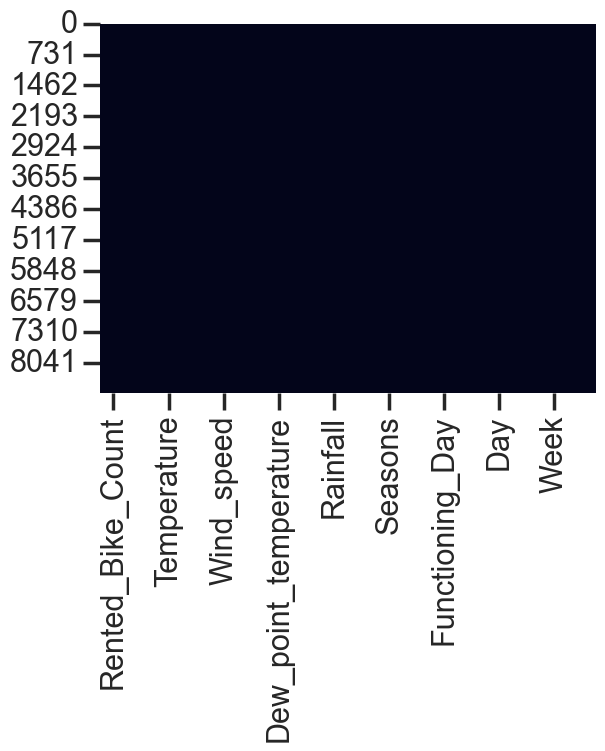

In [87]:
# Visualization of missing values using heatmap
sns.heatmap(dff.isnull(),cbar=False)

## Here no any missing values we have seen but if missing values present in dataset then we apply following techniques:
1. Removing missing values(Drop rows or Drop columns) using dropna function
2. Imputation using Simple Imputer class with mean,median and model using fillna function
3. Model-based Imputation like KNNImputer
4. Create new column to indicate missingness
5.Drop high missing values above a threshold value

 Scenarios:
<5% missing    :  Drop or Simple Imputation
>5% and <30%    :  Impute with mean/median/mode
>30%           :   Drop or use model-based imputation
Time series    : Interpolation or froward/backward fill
Categorical    :  Mode,constant ,or label encoding missing


### 2. Handling Outliers

In [88]:
from scipy.stats import zscore

In [89]:
#Convert Year to categorical
dff['Year']=dff['Year'].astype(str)

In [90]:
#Identifying numeric columns
numeric_cols=dff.select_dtypes(include='number').columns.tolist()

In [91]:
# Splitting into symmetric and skewed features
symmetric_features=[]
skewed_features=[]

for col in numeric_cols:
    mean=dff[col].mean()
    median=dff[col].median()
    if abs(mean-median)<0.2:
        symmetric_features.append(col)
    else:
        skewed_features.append(col)

In [92]:
#Printing the features as symmetric and asymmetric
print("Symmetric features",symmetric_features)
print("Skewed features",skewed_features)

Symmetric features ['Hour', 'Rainfall', 'Snowfall']
Skewed features ['Rented_Bike_Count', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation']


#### IQR for skewed_features to treat outliers

In [93]:
for col in skewed_features:
    Q1=dff[col].quantile(0.25)
    Q3=dff[col].quantile(0.75)
    IQR=Q3-Q1
    lower_bound=Q1-1.5*IQR
    upper_bound=Q3+1.5*IQR
    dff[col] = np.where(
    dff[col] < lower_bound, lower_bound,
    np.where(dff[col] > upper_bound, upper_bound, dff[col])
)


#### Z-score for symmetric features

In [94]:
for col in symmetric_features:
    z_scores=zscore(dff[col])
    dff[col]=np.where(
        z_scores>3,dff[col].mean(),
        np.where(z_scores<-3,dff[col].mean(),dff[col])
    )

##### Outlier treatment successfull

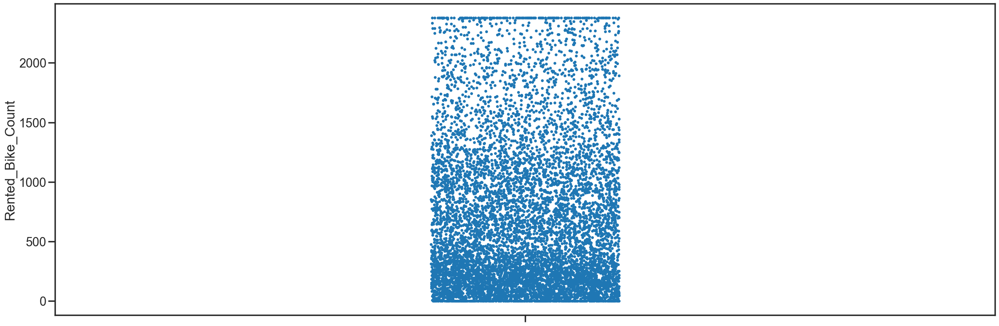

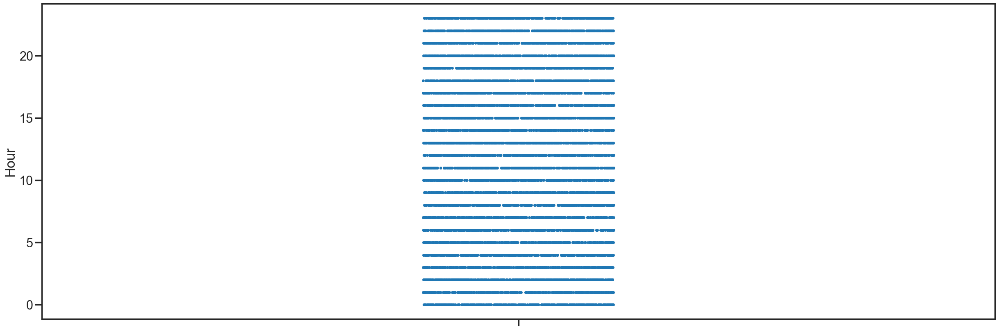

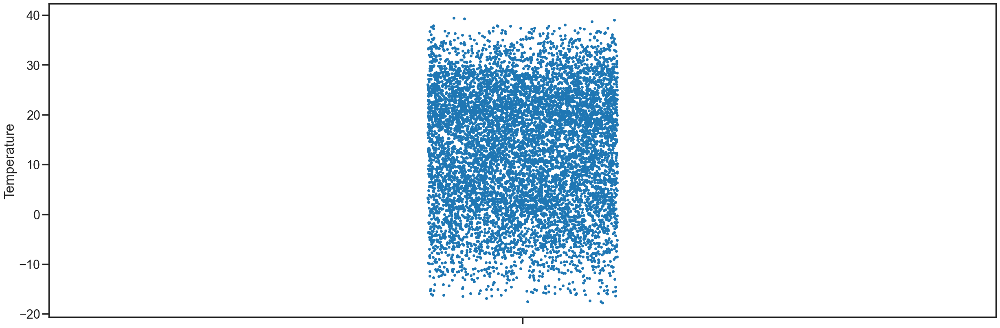

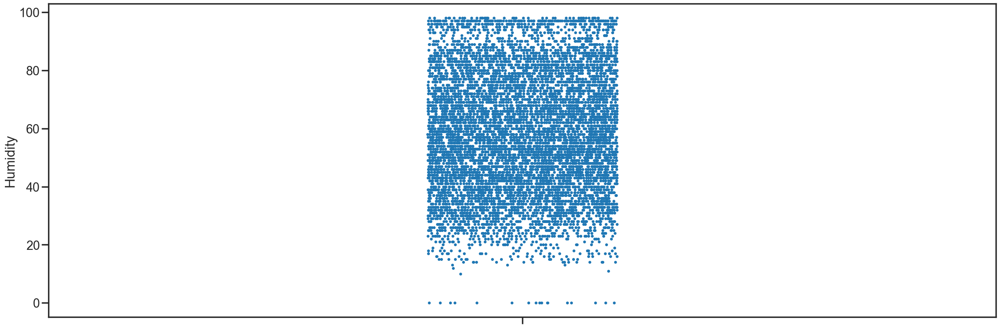

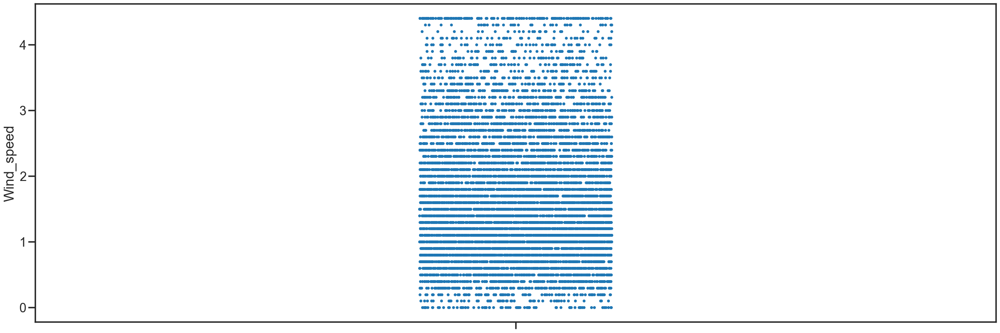

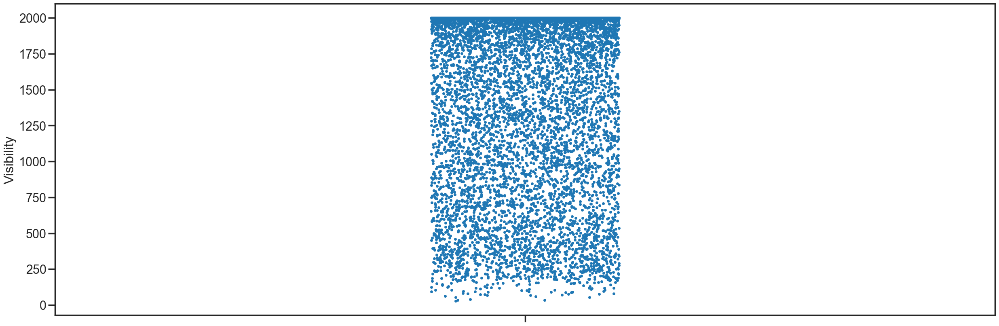

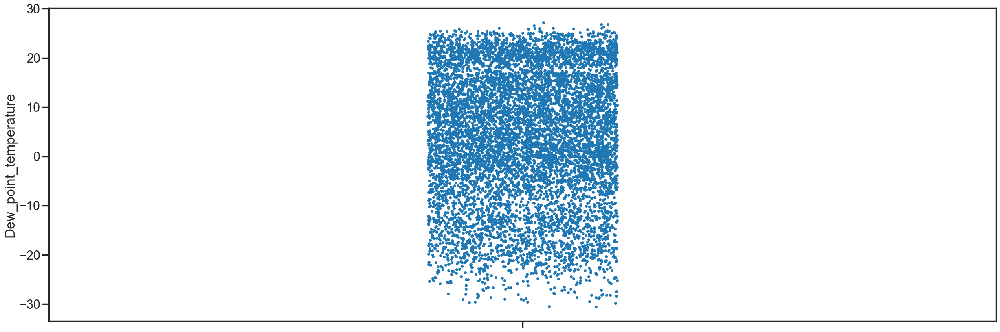

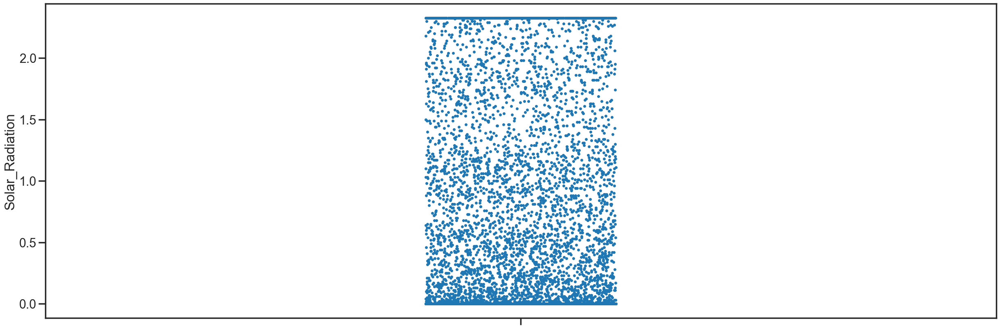

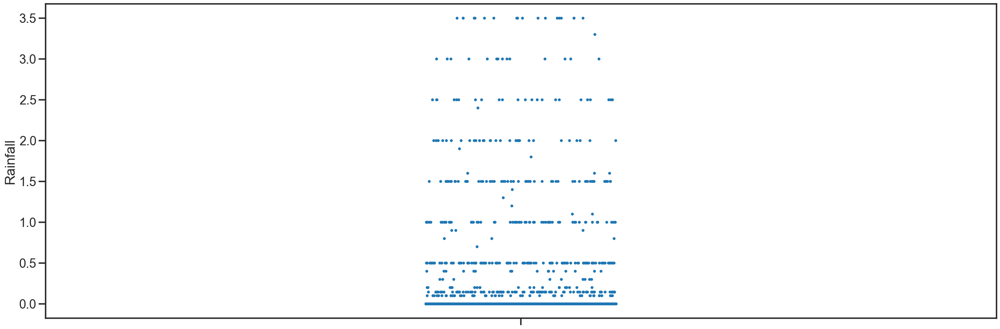

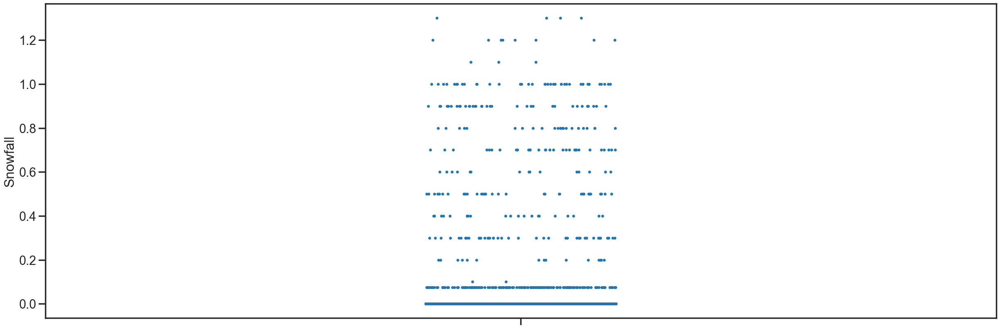

In [95]:
for col in dff.describe().columns:
    fig=plt.figure(figsize=(30,10))
    sns.stripplot(dff[col])

#### What we have done
First I changed the Year column to sring as it shouldn't be treated as numerical column as there are only two type of values and should be treated as categorical column. Then I separated the skew symmetric and symmetric features and define the upper and lower boundry as defined below. Then, I used capping method to change outliers into upper and lower limit instead of trimming where i could have just removed the entire data.

Another way to do it is dropping extreme values.

In a Gaussian distribution while it’s the symmetric curve and outlier are present. Then, we can set the boundary by taking standard deviation into action.

## 3. Categorical Encoding

##### Categorical features we have

In [96]:
cat_feautres=dff.select_dtypes(include='object')
print(f"Categorical features:{cat_feautres.columns.to_list()}")

Categorical features:['Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day', 'Year', 'Week', 'Time_Period']


In [97]:
d1=dff.copy()

In [98]:
d2=dff.copy()

In [99]:
dff.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day',
       'Year', 'Week', 'Time_Period'],
      dtype='object')

#### Deleting extra features (Month,Day,Time_Period,Year)
Deleting some extra features like 'Day','Time_period','Year' and 'Month' because day has been converted into working and weekends, timeperiod as keeping hour since it show good correlation, month because it is already shorten to seasons and year because it does not have much variation and there is less to learn from that.

In [100]:
dff.drop(columns=['Day','Month','Year','Time_Period'],axis=1,inplace=True)

In [101]:
## applying encoding to categorical features
dff=pd.get_dummies(dff,drop_first=True,dtype=int)


In [102]:
dff.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter',
       'Holiday_No Holiday', 'Functioning_Day_Yes', 'Week_Working Day'],
      dtype='object')

In [103]:
dff.rename(columns={
    'Holiday_No Holiday':'Holiday_No_Holiday',
    'Week_Working Day':'Week_Working_Day'
},inplace=True)

In [104]:
dff.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter',
       'Holiday_No_Holiday', 'Functioning_Day_Yes', 'Week_Working_Day'],
      dtype='object')

### Feature Manipulation & Selection

### Let us calculate the Absolute humidity
Absolute humidity is the mass of water vapor in a given volume of air, while relative humidity is the percentage of water vapor in the air compared to the maximum amount of water vapor that the air can hold at a particular temperature.

Hence using the two column temperature and dewpoint calculating absolute humidity, as a new feature as both of them were showing high correlation.

In [105]:
import math
def absolute_humidity(dff,temperature_column,dew_point_column):
    # constants
    a=17.27
    b=237.7

    #create a new column for absolute humidity
    dff['Absolute_Humidity']=None

    #iterate over the rows of the DataFrame
    for index,row in dff.iterrows():
        temperature=row[temperature_column]
        dew_point=row[dew_point_column]

        #check for dew point equal to or higher than temperature
        if dew_point >=temperature:
            dff.at[index,'Absolute_Humidity']=0.0
        else:
            #calculate the saturation vapour pressure
            svp=(a*dew_point)/(b+dew_point)

            if temperature==0:
                dff.at[index,'Absolute_Humidity']=0.0
            else:
                ah=6.112*svp*math.exp((a*temperature)/(b+temperature))/temperature

                #store the absolute humidity  in the new column
                dff.at[index,'Absolute_Humidity']=ah
    
    return dff

In [106]:
#calling function
dff=absolute_humidity(dff,'Temperature','Dew_point_temperature')

In [107]:
dff['Absolute_Humidity']=dff['Absolute_Humidity'].astype('int')

In [108]:
#replacing infinity with 0
np.isinf(dff).values.sum()
dff.replace([np.inf,-np.inf],0,inplace=True)

Dropping values when there is no functioning day, because there are no bike rented. Secondly because it can cause overfitting as it will act as extra feature but due to less variation will not help model to learn. Thirdly when checked in later, this column was removed leaving rented bike count as zero so there will be no relation why there will be zero rented bike.

In [109]:
dff=dff.drop(dff[dff['Functioning_Day_Yes']==0].index)

In [110]:
#Deleting extra feature
dff.drop(columns=['Functioning_Day_Yes'],axis=1,inplace=True)

# Feature Selection

In [111]:
dff.shape

(8465, 16)

#### Dropping constant and quasi constant feature

In [114]:
from sklearn.feature_selection import VarianceThreshold

def dropping_constant(data):
    selector=VarianceThreshold(threshold=0.05)
    selector.fit(data)
    dropped_col=[column for column in data.columns if column not in data.columns[selector.get_support()]]
    print(f"Columns dropped:{dropped_col}")
    dff=data.drop(dropped_col,axis=1)
    return dff

In [115]:
#calling the function
dff=dropping_constant(dff)

Columns dropped:['Snowfall', 'Holiday_No_Holiday']


In [118]:
dff.shape

(8465, 14)

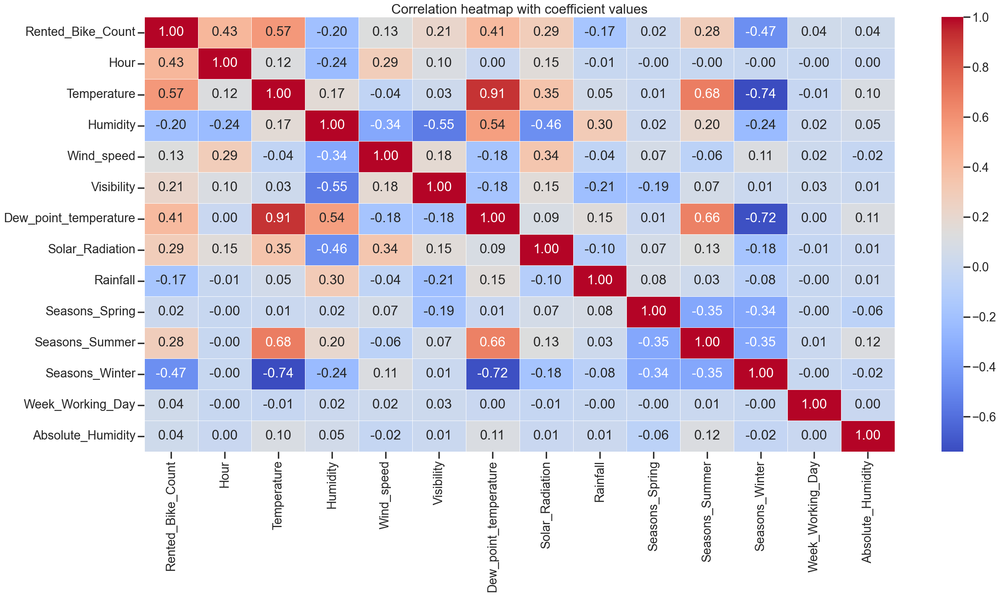

In [120]:
numerical=dff.select_dtypes(include='number')

corr_matrix=numerical.corr()
plt.figure(figsize=(30,14))
sns.heatmap(corr_matrix,annot=True,fmt=".2f",cmap='coolwarm',linewidth=0.5)
plt.title("Correlation heatmap with coefficient values")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

### We will remove some unwanted features like ('Humidity') created new feature as absolute humidity

In [123]:
dff=dff.drop(columns=['Humidity'],axis=1)

In [125]:
dff.shape

(8465, 13)

#### Let us check the multicollinearity using VIF(Variance Inflation factor)
Calculating vif identify the strength of correlation between independent variable and the strength of that correlation.

Vif starts at 1 and has no upper limit.

1-5 : Moderate, No corrective measure

Greater than 5: Severe, Coefficient and p-value are questionable

In [126]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [133]:
#Calculation VIF
def cal_vif(x):
    vif=pd.DataFrame()
    vif['variables']=x.columns
    vif['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return(vif)

In [130]:
# selecting only the independent columns
X=dff.drop(['Rented_Bike_Count'],axis=1)

In [148]:
#calling the vif function
vif_df=cal_vif(X)
print(vif_df)

                variables        VIF
0                    Hour   4.435542
1             Temperature  34.495525
2              Wind_speed   5.021456
3              Visibility   8.163282
4   Dew_point_temperature  16.686687
5         Solar_Radiation   2.879041
6                Rainfall   1.107381
7          Seasons_Spring   1.880661
8          Seasons_Summer   3.516642
9          Seasons_Winter   3.026994
10       Week_Working_Day   3.100867
11      Absolute_Humidity   1.028945


## Here vif shows high VIF columns are (Temperature,Dew_Point_Tempereture,Visibility)

In [139]:
# Check feature correlation and finding multicolinearity
def correlation(df,threshold):
    col_corr=set()
    corr_matrix=df.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs (corr_matrix.iloc[i,j])>threshold:
                colname=corr_matrix.columns[i]
                col_corr.add(colname)
    return list(col_corr)

In [141]:
highly_correlated_columns=correlation(dff,0.6)
highly_correlated_columns

['Dew_point_temperature', 'Seasons_Summer', 'Seasons_Winter']

In [142]:
# Dropping the highly correlated features
dff=dff.drop(highly_correlated_columns,axis=1)
dff.shape

(8465, 10)

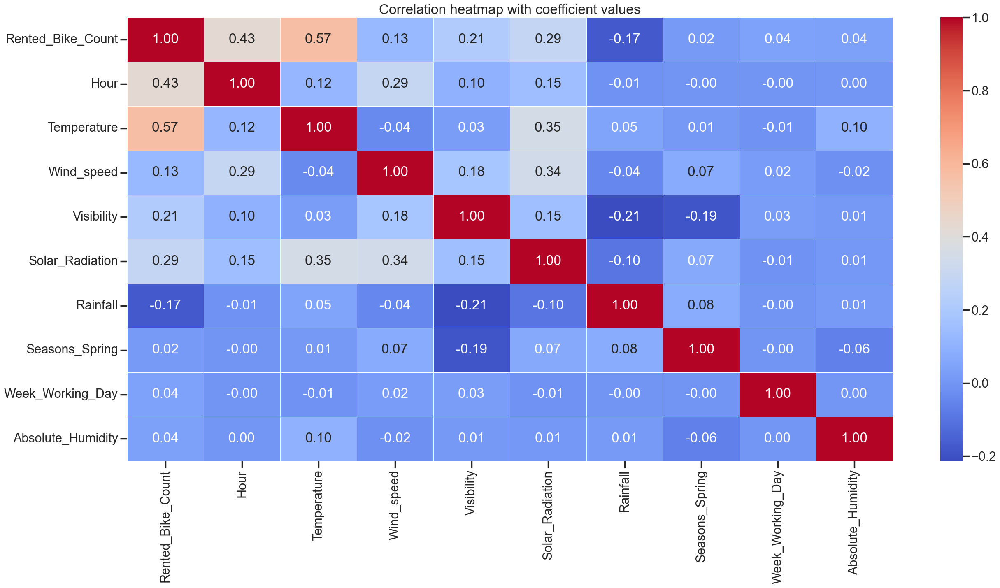

In [143]:
#Correlation heatmap
numerical=dff.select_dtypes(include='number')

corr_matrix=numerical.corr()
plt.figure(figsize=(30,14))
sns.heatmap(corr_matrix,annot=True,fmt=".2f",cmap='coolwarm',linewidth=0.5)
plt.title("Correlation heatmap with coefficient values")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

## Rechecking the VIF after dropping the higher correlated features

In [144]:
vif_1=dff.drop(columns=['Rented_Bike_Count'],axis=1)

In [147]:
vif_df_post=cal_vif(vif_1)
print(vif_df_post)

           variables       VIF
0               Hour  3.911063
1        Temperature  2.392959
2         Wind_speed  4.686659
3         Visibility  4.839088
4    Solar_Radiation  1.953570
5           Rainfall  1.075573
6     Seasons_Spring  1.341016
7   Week_Working_Day  2.920318
8  Absolute_Humidity  1.022853


### Here we have seen that none of the highly vif are found

In [149]:
dff.shape

(8465, 10)

## Here are the most important feature featuer selection

In [151]:
dff.columns.tolist()

['Rented_Bike_Count',
 'Hour',
 'Temperature',
 'Wind_speed',
 'Visibility',
 'Solar_Radiation',
 'Rainfall',
 'Seasons_Spring',
 'Week_Working_Day',
 'Absolute_Humidity']

## Data Transformation

##### Getting symmetric and skew-symmetric columns from the columns

In [152]:
symmetric_features=[]
skew_symmetric_features=[]

for i in dff.describe().columns:
    if abs(dff[i].mean()-dff[i].median())<0.1:
        symmetric_features.append(i)
    else:
        skew_symmetric_features.append(i)

In [153]:
#Printing the results
print("Symmetric feaures:",symmetric_features)
print("Skew symmetric features:",skew_symmetric_features)

Symmetric feaures: ['Rainfall']
Skew symmetric features: ['Rented_Bike_Count', 'Hour', 'Temperature', 'Wind_speed', 'Visibility', 'Solar_Radiation', 'Seasons_Spring', 'Week_Working_Day', 'Absolute_Humidity']


In [155]:
## check for skewness
skewness=dff.select_dtypes(include='number').skew().sort_values(ascending=False)
print("Skewness",skewness)

Skewness Rainfall             7.300263
Solar_Radiation      1.273301
Seasons_Spring       1.123394
Rented_Bike_Count    0.985751
Wind_speed           0.714015
Hour                -0.001261
Temperature         -0.174550
Visibility          -0.695306
Week_Working_Day    -0.934539
Absolute_Humidity   -1.328046
dtype: float64


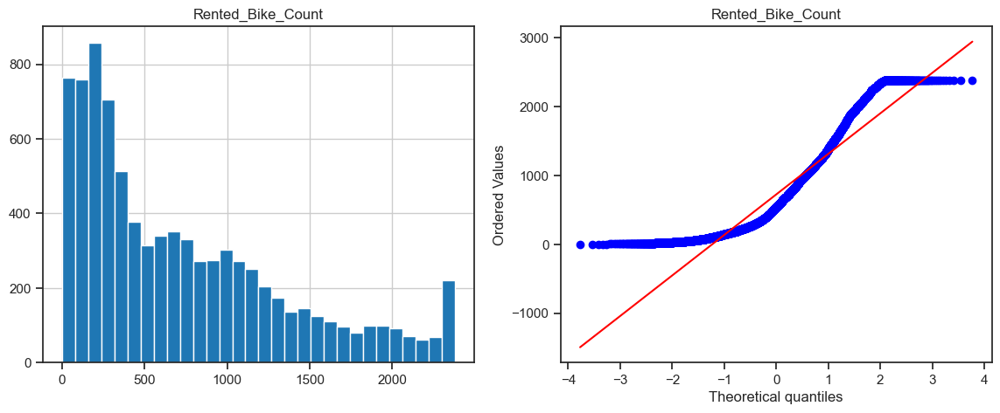

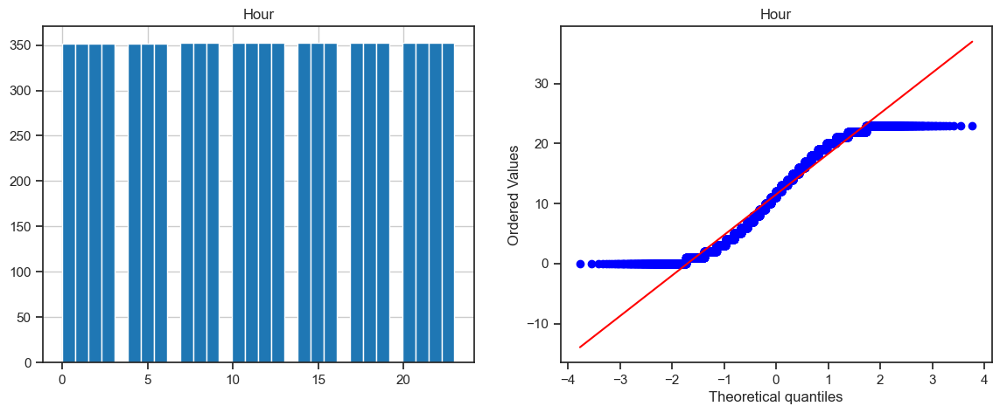

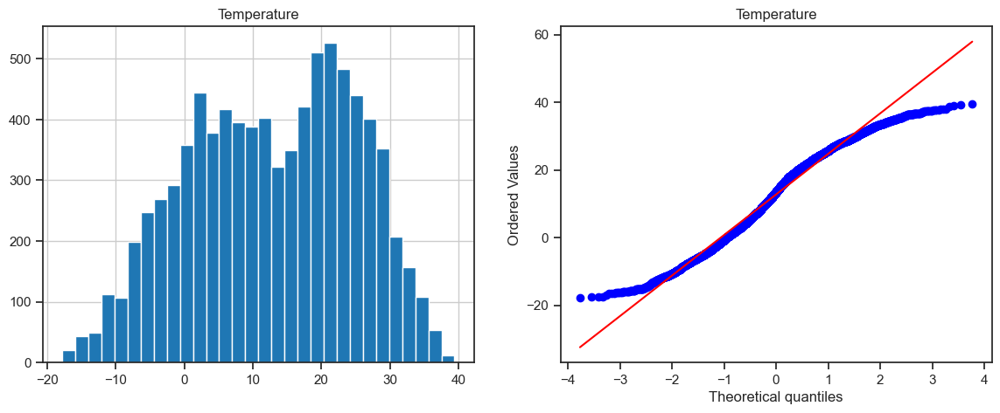

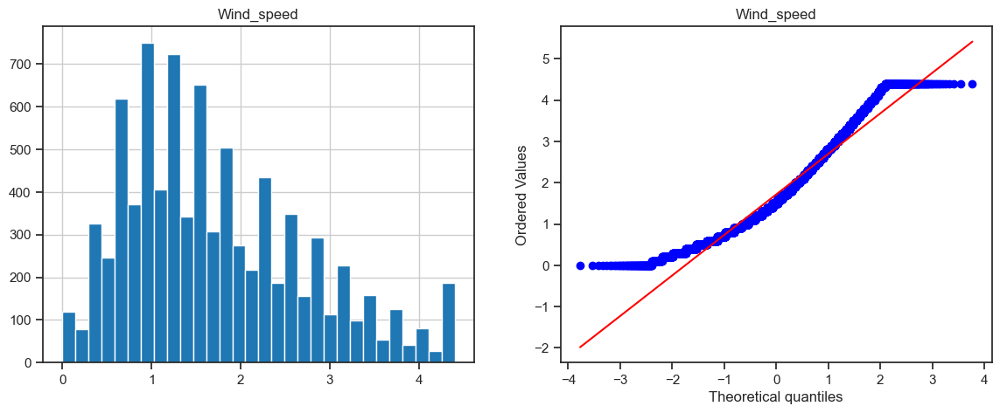

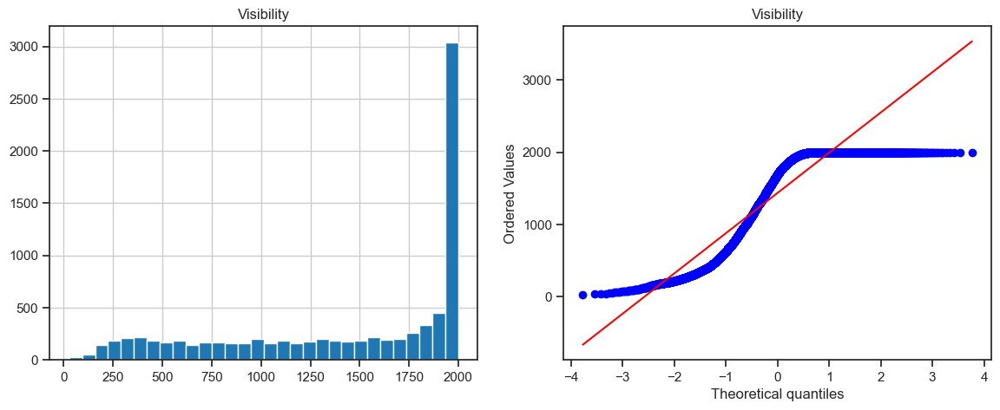

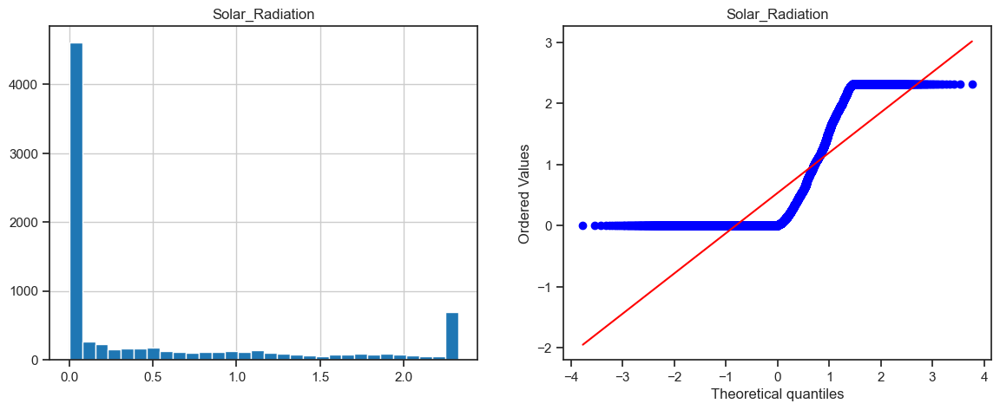

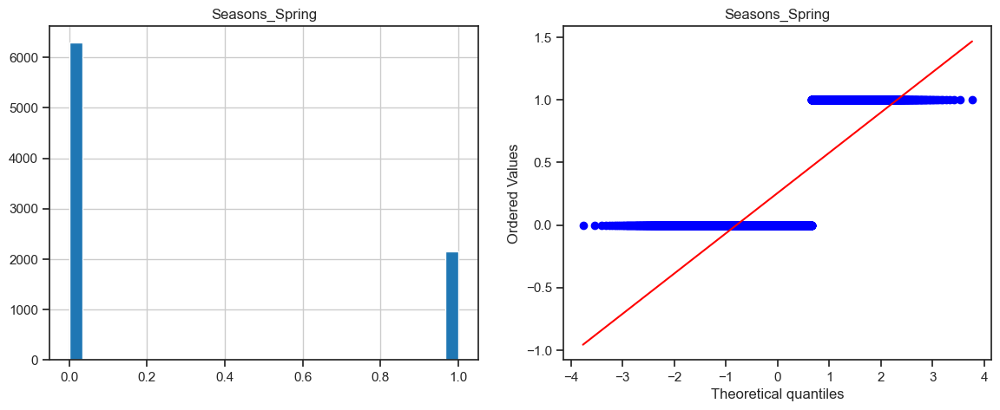

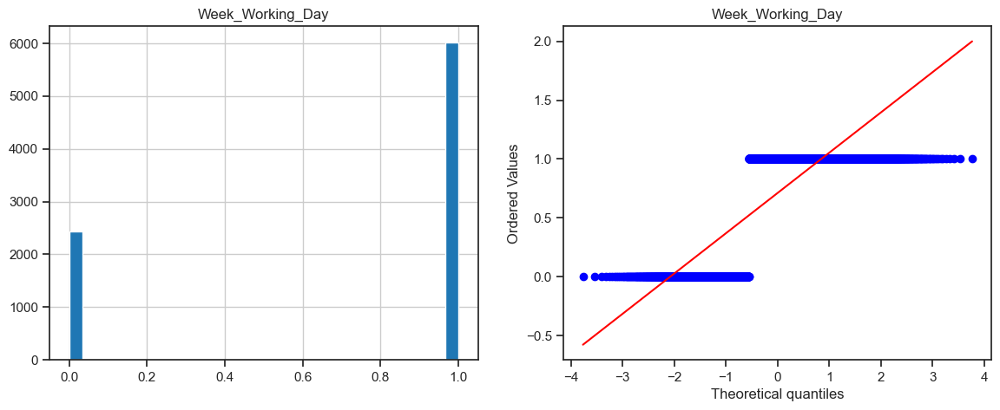

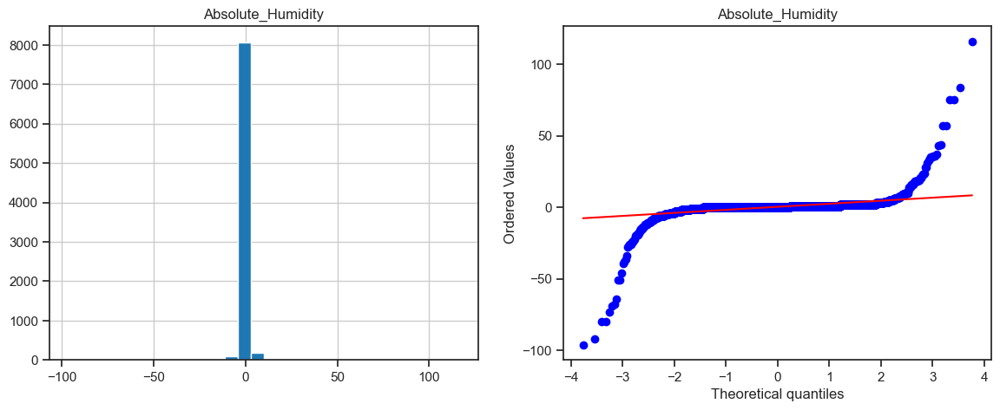

In [157]:
#visualization
for variable in skew_symmetric_features:
    sns.set_context('notebook')
    plt.figure(figsize=(14,5))
    plt.subplot(1,2,1)
    dff[variable].hist(bins=30)
    plt.title(variable)

    ##QQ plot
    plt.subplot(1,2,2)
    stats.probplot(dff[variable],dist='norm',plot=plt)
    plt.title(variable)
    plt.show()
    print('='*120)

## Applying the transformation on (Wind_speed) and (Rendted_Bike_count) as other columns when applied transformation change to right to left skewed hence ignoring transformation.

In [158]:
dff['Wind_speed']=np.cbrt(dff['Wind_speed'])
dff['Rented_Bike_Count']=np.sqrt(dff['Rented_Bike_Count'])

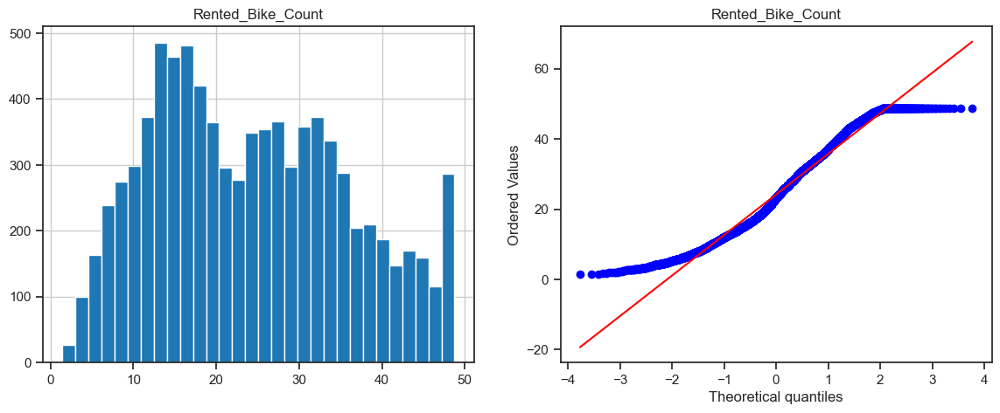

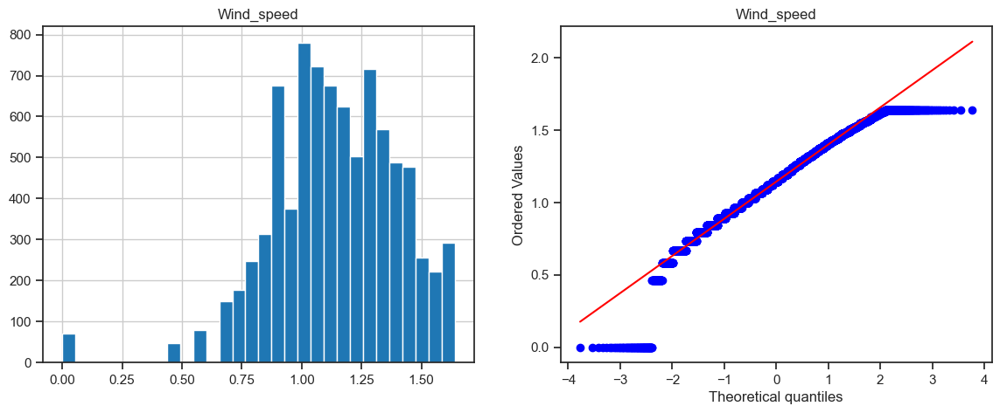

In [159]:
#Visualization
for col in skew_symmetric_features:
    if (col=='Wind_speed') | (col=='Rented_Bike_Count'):
        plt.figure(figsize=(14,5))
        plt.subplot(1,2,1)
        dff[col].hist(bins=30)
        plt.title(col)

        ##QQ plot
        plt.subplot(1,2,2)
        stats.probplot(dff[col],dist='norm',plot=plt)
        plt.title(col)
        plt.show()

#### Purpose
The purpose of transformation is to convert the values of the dataset's numeric columns to a standard scale without distorting the distinctions between different value ranges or omitting crucial details. Transformation can be achieved using different techniques i.e., either taking log, square root or cuberoot for the value.

square-root for moderate skew: sqrt(x) for positively skewed data, sqrt(max(x+1) - x) for negatively skewed data

log for greater skew: log10(x) for positively skewed data, log10(max(x+1) - x) for negatively skewed data

inverse for severe skew: 1/x for positively skewed data 1/(max(x+1) - x) for negatively skewed data

Linearity and heteroscedasticity: First try log transformation in a situation where the dependent variable starts to increase more rapidly with increasing independent variable values If your data does the opposite – dependent variable values decrease more rapidly with increasing independent variable values – you can first consider a square transformation.

## Data Scaling

In [161]:
dff.Hour=dff.Hour.astype('int')

In [163]:
dff.head()

,Rented_Bike_Count,Hour,Temperature,Wind_speed,Visibility,Solar_Radiation,Rainfall,Seasons_Spring,Week_Working_Day,Absolute_Humidity
0,15.937377,0,-5.2,1.300591,2000.0,0.0,0.0,0,1,1
1,14.282857,1,-5.5,0.928318,2000.0,0.0,0.0,0,1,1
2,13.152946,2,-6.0,1.000000,2000.0,0.0,0.0,0,1,0
3,10.344080,3,-6.2,0.965489,2000.0,0.0,0.0,0,1,0
4,8.831761,4,-6.0,1.320006,2000.0,0.0,0.0,0,1,0


C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\995288938.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dff[col])


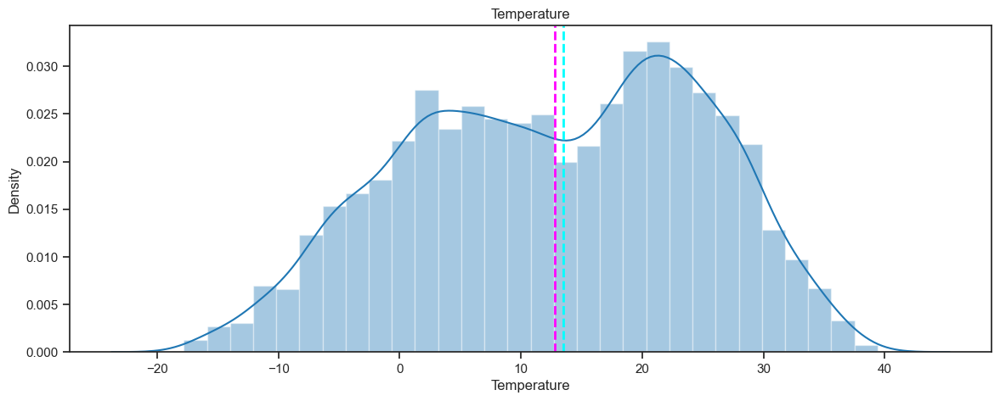

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\995288938.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dff[col])


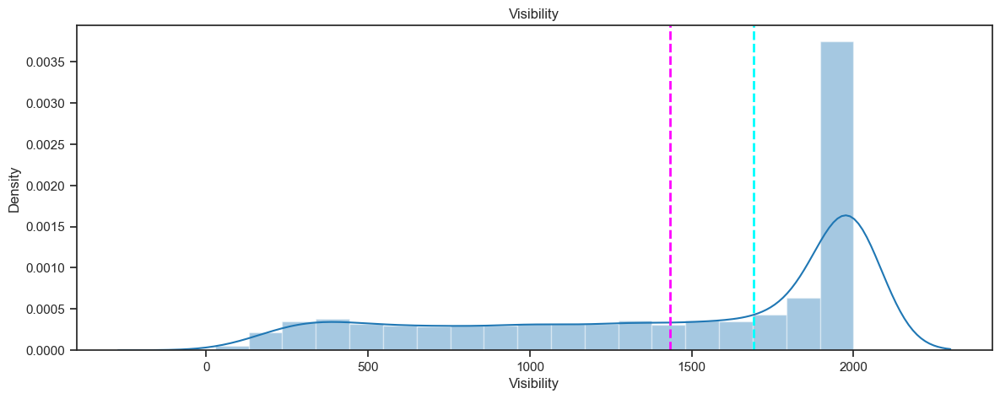

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\995288938.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dff[col])


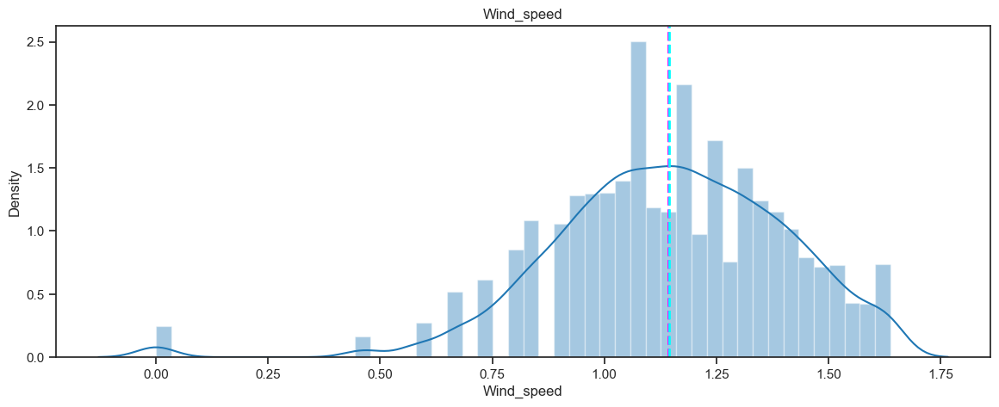

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\995288938.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dff[col])


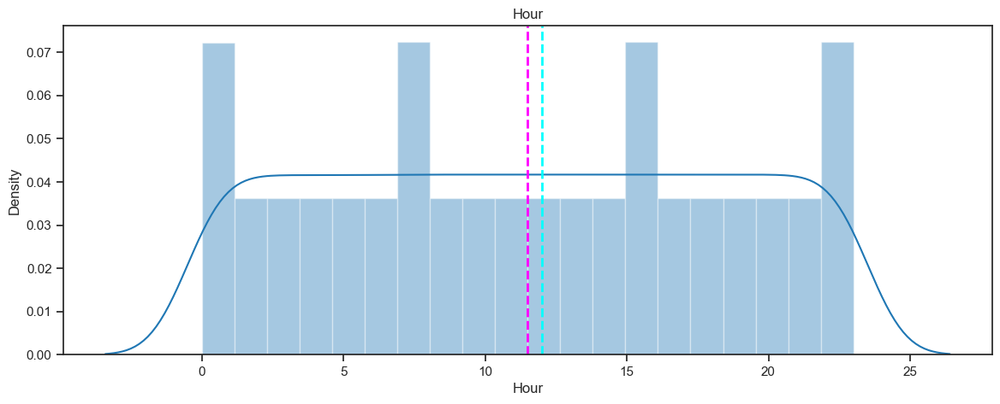

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\995288938.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dff[col])


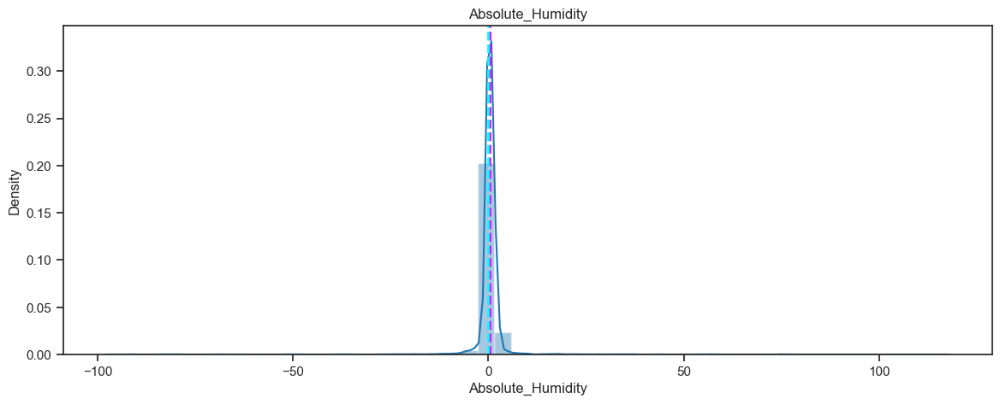

In [164]:
#visualization
for col in ['Temperature','Visibility','Wind_speed','Hour','Absolute_Humidity']:
    fig=plt.figure(figsize=(14,5))
    ax=fig.gca()
    feature=(dff[col])
    sns.distplot(dff[col])
    ax.axvline(feature.mean(),color='magenta',linestyle='dashed',linewidth=2)
    ax.axvline(feature.median(),color='cyan',linestyle='dashed',linewidth=2)
    ax.set_title(col)
    plt.show()

In [165]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

In [166]:
#Transformation
for col in skew_symmetric_features:
    if col=='Rented_Bike_Count':
        pass
    elif col=='Wind_speed':
        dff[col]=StandardScaler().fit_transform(dff[col].values.reshape(-1,1))
    else:
        dff[col]=MinMaxScaler().fit_transform(dff[col].values.reshape(-1,1))

In [167]:
dff.head()

,Rented_Bike_Count,Hour,Temperature,Wind_speed,Visibility,Solar_Radiation,Rainfall,Seasons_Spring,Week_Working_Day,Absolute_Humidity
0,15.937377,0.000000,0.220280,0.601107,1.0,0.0,0.0,0.0,1.0,0.457547
1,14.282857,0.043478,0.215035,-0.824052,1.0,0.0,0.0,0.0,1.0,0.457547
2,13.152946,0.086957,0.206294,-0.549634,1.0,0.0,0.0,0.0,1.0,0.452830
3,10.344080,0.130435,0.202797,-0.681749,1.0,0.0,0.0,0.0,1.0,0.452830
4,8.831761,0.173913,0.206294,0.675431,1.0,0.0,0.0,0.0,1.0,0.452830


## Scaling perpective
When we are using an algorithm that assumes your features have a similar range, we should use feature scaling.

If the ranges of features differ much then we should use feature scaling. If the range does not vary a lot like one of them is between 0 and 2 and the other one is between -1 and 0.5 then we can leave them as it's. However, we should use feature scaling if the ranges are, for example, between -2 and 2 and between -100 and 100.

Use Standardization when your data follows Gaussian distribution. Use Normalization when your data does not follow Gaussian distribution.

So, in my data few of the features were having large difference in distribution, that's why, I have used standardization using standardscaler on windspeed as it showed normal distribution and normalization using minmaxscaler on others.

## Dimensionality Reduction
This dataset doesnot need any dimensionality reduction.

Dimensionality reduction is a technique that is used to reduce the number of features in a dataset. It is often used when the number of features is very large, as this can lead to problems such as overfitting and slow computation. There are a variety of techniques that can be used for dimensionality reduction, such as principal component analysis (PCA) and singular value decomposition (SVD).

There are several reasons why dimensionality reduction might be useful. One reason is that it can help to reduce the size of a dataset, which can be particularly useful when the dataset is very large. It can also help to improve the performance of machine learning models by reducing the number of features that the model has to consider, which can lead to faster computation and better generalization to new data.

Another reason to use dimensionality reduction is to reduce the curse of dimensionality, which refers to the fact that as the number of dimensions increases, the volume of the space increases exponentially. This can lead to problems such as the nearest neighbor search becoming less effective, as the distances between points become much larger. Dimensionality reduction can help to reduce the curse of dimensionality by reducing the number of dimensions in the data.

Finally, dimensionality reduction can also be useful for visualizing high-dimensional data. It can be difficult to visualize data in more than three dimensions, so reducing the number of dimensions can make it easier to understand the patterns in the data.

## Here all the steps before fitting to the algorithm has been done.

## Data Splitting

In [168]:
from sklearn.model_selection import train_test_split

In [170]:
# independent features
X=dff.drop('Rented_Bike_Count',axis=1)

In [171]:
# dependent feature
y=dff['Rented_Bike_Count']

In [173]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

## Machine Learning Implementation

## Linear Regression

In [175]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

In [176]:
lr_model=LinearRegression()
lr_model.fit(X_train,y_train)

LinearRegression()

In [177]:
lr_pred=lr_model.predict(X_test)

In [180]:
r2=r2_score(y_test,lr_pred)
rmse=np.sqrt(mean_squared_error(y_test,lr_pred))

print(f"R2 score:{r2:.4f}")
print(f"RMSE:{rmse:.2f}")

R2 score:0.5703
RMSE:7.63


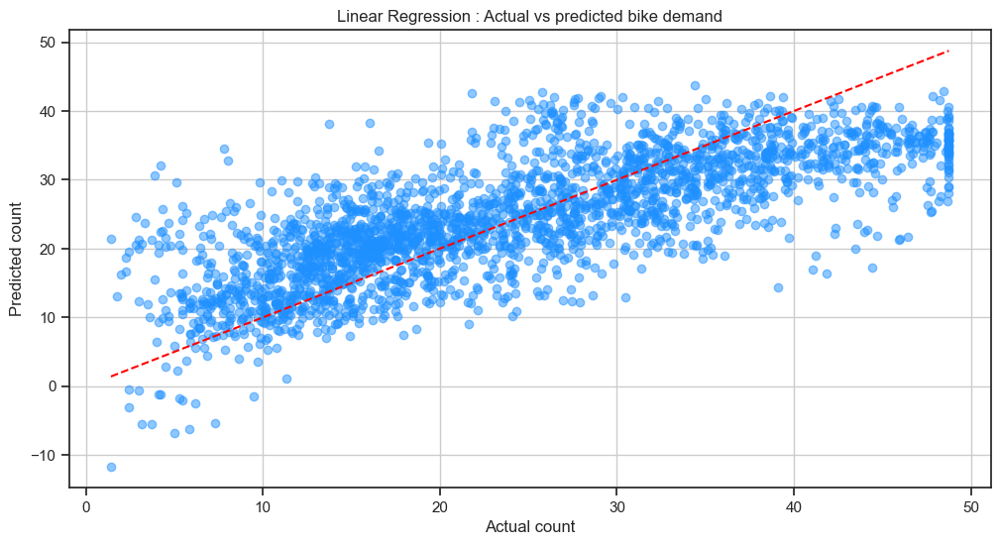

In [181]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.scatter(y_test,lr_pred,alpha=0.5,color='dodgerblue')
plt.plot([y_test.min(),y_test.max()],[y_test.min(),y_test.max()],'r--')
plt.xlabel("Actual count")
plt.ylabel("Predicted count")
plt.title('Linear Regression : Actual vs predicted bike demand')
plt.grid(True)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

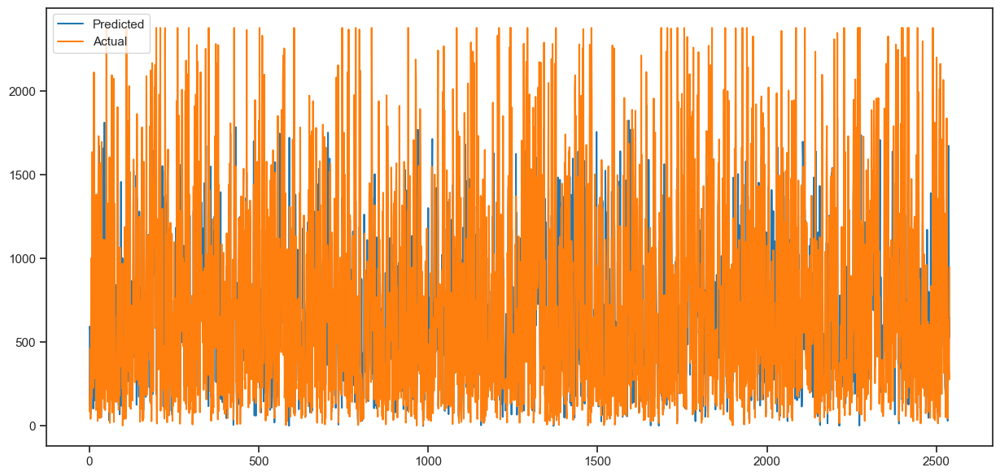

In [196]:
sns.set_context('notebook')
plt.figure(figsize=(15,7))
plt.plot(np.square(lr_pred))
plt.plot(np.array(np.square(y_test)))
plt.legend(['Predicted','Actual'])
plt.show

# Random Forest Regressor

In [197]:
from sklearn.ensemble import RandomForestRegressor

In [199]:
rf_model=RandomForestRegressor(n_estimators=100,random_state=42,n_jobs=-1)
rf_model.fit(X_train,y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [200]:
rf_pred=rf_model.predict(X_test)

In [201]:
rf_r2=r2_score(y_test,rf_pred)
rf_rmse=np.sqrt(mean_squared_error(y_test,rf_pred))

print(f"rf_r2 score:{rf_r2:.4f}")
print(f"rf_rmse:{rf_rmse:.2f}")

rf_r2 score:0.8818
rf_rmse:4.00


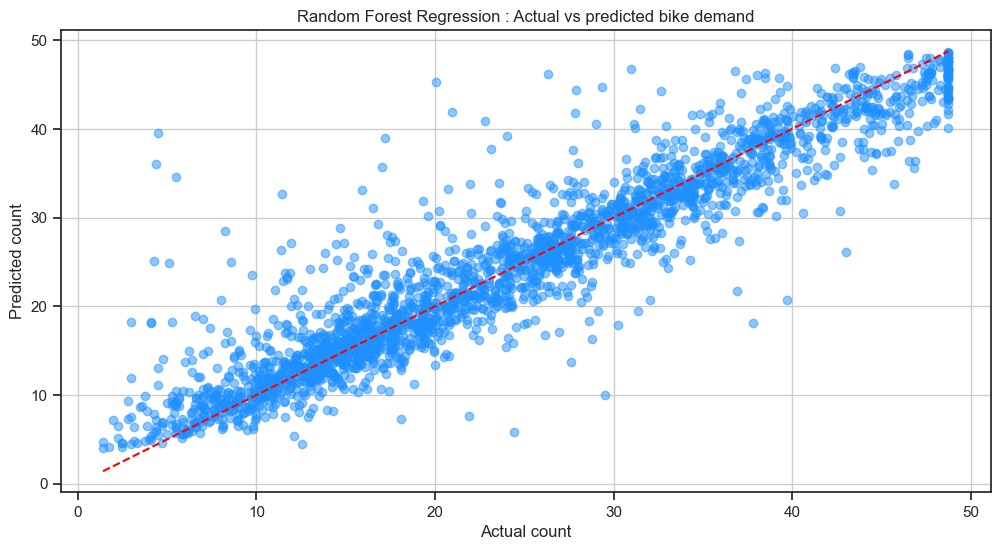

In [202]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.scatter(y_test,rf_pred,alpha=0.5,color='dodgerblue')
plt.plot([y_test.min(),y_test.max()],[y_test.min(),y_test.max()],'r--')
plt.xlabel("Actual count")
plt.ylabel("Predicted count")
plt.title('Random Forest Regression : Actual vs predicted bike demand')
plt.grid(True)
plt.show()

### Visualizing feature importance

In [203]:
import seaborn as sns

#get feature importance
importances=rf_model.feature_importances_
feature_names=X_train.columns

In [205]:
#creating dataframes
feat_imp=pd.DataFrame({'feature':feature_names,'Importance':importances})
feat_imp=feat_imp.sort_values(by='Importance',ascending=False)

C:\Users\Ankit\AppData\Local\Temp\ipykernel_2672\4082260901.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance',y='feature',data=feat_imp,palette='viridis')


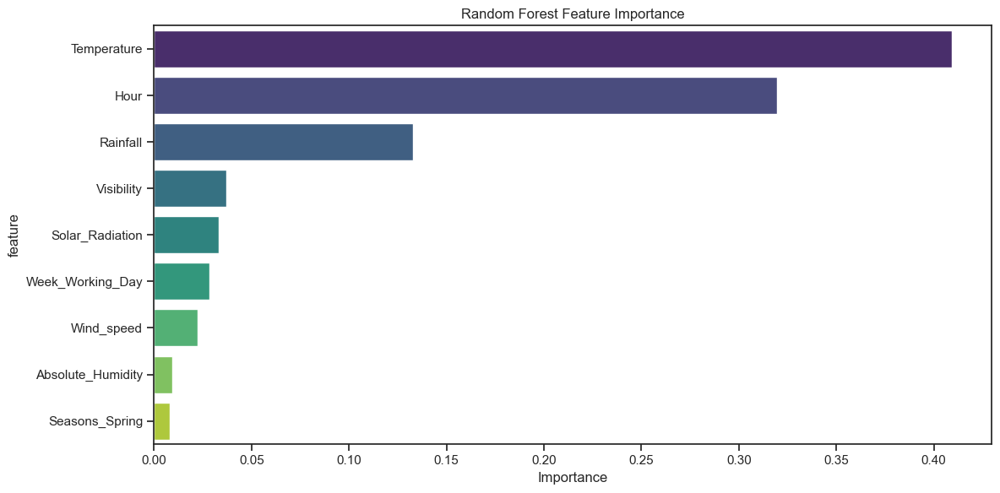

In [207]:
plt.figure(figsize=(12,6))
sns.barplot(x='Importance',y='feature',data=feat_imp,palette='viridis')
plt.title('Random Forest Feature Importance')
plt.tight_layout()
plt.show()

## XgBoost Algorithm

In [208]:
from xgboost import XGBRegressor

In [214]:
xgb=XGBRegressor(objective='reg:squarederror')

In [215]:
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [216]:
xgb_predict=xgb.predict(X_test)

In [217]:
xgb_r2=r2_score(y_test,xgb_predict)
xgb_rmse=np.sqrt(mean_squared_error(y_test,xgb_predict))

print(f"r2_score: {xgb_r2:.4f}")
print(f"RMSE:{xgb_rmse:.2f}")

r2_score: 0.8819
RMSE:4.00


## Conclusion
The main goal of the project was to stablize bike demand at every hour. Based on the objective, it was found that:

XGBRegressor models shows promising result with R2 score of 0.88, therefore it can be used to solve this problem.

Bike rental count is high during working days than on weekend.

Bike demand shows peek around 8-9 AM in the morning and 6 - 7pm in the evening.

People prefer to rent bike more in summer than in winter.

Bike demand is more on clear days than on snowy or rainy days.

Temperature range from 22 to 25(°C) has more demand for bike.

'Hour', 'Temperature(°C)', 'Humidity', 'Wind_speed','Visibility ', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons', 'day of week ' regulates bike demand

## Here we have completed the project